# AI-Powered Solar Panel Defect Classification — Final UREC1-Aligned Kaggle Pipeline

**Research implementation:** six-class visible-light RGB image classification of solar-panel conditions.

**Approved dataset**
- Dataset: **PV Panel Defect Dataset**
- Creator: **Alicja Lenarczyk**
- Kaggle: `alicjalena/pv-panel-defect-dataset`
- Expected path: `/kaggle/input/datasets/alicjalena/pv-panel-defect-dataset`
- UREC1-stated raw image count: **1,574**
- Licence recorded in UREC1: **CC BY-NC-SA 4.0**

**UREC1 model comparison**
- ResNet-50
- EfficientNet-B0
- YOLOv8 Classification

**UREC1 evaluation**
- Accuracy and balanced accuracy
- Per-class precision, recall and F1-score
- Macro-F1 and weighted-F1
- Confusion matrices
- ROC and precision-recall curves
- Confidence and calibration analysis
- Model size and end-to-end inference time

**UREC1 data handling**
- Secondary Kaggle data only
- Corrupt-file audit
- SHA-256 exact-duplicate audit before splitting
- Cross-class duplicate-conflict removal
- Stratified **80:10:10** train/validation/test split
- Training-only augmentation
- Imbalance handling where required
- Validation-only model selection
- Held-out test set used only after model selection

**Deployment**
The validation-selected model is packaged as a **Streamlit application for a Hugging Face Docker Space**.

> Before running: add the approved Alicja Lenarczyk dataset to Kaggle, enable a GPU accelerator, and enable Internet on the first run so pretrained weights and Ultralytics can be obtained if they are not already cached.

> Research integrity: this notebook does not force a target accuracy. Report only the outputs produced by the executed notebook.

## 0. Final research protocol

This notebook is the submission version of the experimental pipeline. It follows the approved UREC1 methodology and deliberately prevents the earlier 885-image dataset from being selected.

The approved Kaggle dataset already contains `train`, `val` and `test` folders. Those original folders are used only to locate all approved images. The images are pooled, audited for corruption and exact duplication, and then re-split using the **stratified 80:10:10 protocol specified in UREC1**.

Key safeguards include:

- exact dataset-path verification;
- a strict 1,574-image raw-count guardrail;
- duplicate removal before splitting;
- hash-based leakage checks across final splits;
- training-only augmentation;
- validation macro-F1 checkpointing;
- one-time held-out test evaluation;
- transparent performance-efficiency model selection;
- deployment metadata tied to the dataset actually used.

In [1]:
# 1. Environment setup

# Preserve Kaggle's installed PyTorch, torchvision and CUDA combination.
# Only install Ultralytics when it is not already available.
import sys
import subprocess
import importlib.util

if importlib.util.find_spec("ultralytics") is None:
    print("Ultralytics is not installed. Attempting installation.")
    try:
        subprocess.check_call([
            sys.executable,
            "-m",
            "pip",
            "install",
            "-q",
            "--no-cache-dir",
            "ultralytics"
        ])
    except Exception as exc:
        raise RuntimeError(
            "Ultralytics could not be installed. Enable Kaggle Internet, "
            "restart the session, and run this cell again."
        ) from exc
else:
    print("Ultralytics is already installed; installation skipped.")

import os
import gc
import re
import json
import math
import time
import random
import shutil
import hashlib
import warnings
import zipfile
from pathlib import Path

import numpy as np
import pandas as pd
from PIL import Image, ImageFile

import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score,
    precision_recall_fscore_support,
    classification_report,
    confusion_matrix,
    roc_curve,
    precision_recall_curve,
    auc,
    balanced_accuracy_score,
)
from sklearn.preprocessing import label_binarize

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms

import ultralytics
from ultralytics import YOLO

warnings.filterwarnings("ignore")
ImageFile.LOAD_TRUNCATED_IMAGES = False

print("Python environment ready")
print("PyTorch:", torch.__version__)
print("Ultralytics:", ultralytics.__version__)
print("CUDA reported available:", torch.cuda.is_available())

Ultralytics is not installed. Attempting installation.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 32.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 298.6 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.7 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart#ultralytics-settings.
Python environment ready
PyTorch: 2.10.0+cu128
Ultralytics: 8.4.131
CUDA reported available: True


In [2]:
# 2. Reproducibility, safe device selection and project configuration

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


def select_safe_device():
    """Use CUDA only after a real kernel operation succeeds."""
    if not torch.cuda.is_available():
        print("CUDA is unavailable; CPU fallback selected.")
        return torch.device("cpu")

    try:
        test_tensor = torch.ones(4, device="cuda")
        test_result = test_tensor * 2
        torch.cuda.synchronize()

        print("CUDA kernel test passed")
        print("GPU:", torch.cuda.get_device_name(0))
        print("Compute capability:", torch.cuda.get_device_capability(0))
        print("Kernel test result:", test_result.cpu().numpy())
        return torch.device("cuda")

    except Exception as exc:
        print("CUDA was detected but could not execute a PyTorch kernel.")
        print("Error:", exc)
        print("CPU fallback selected. A fresh Kaggle GPU session is recommended.")
        return torch.device("cpu")


DEVICE = select_safe_device()

# UREC1 dataset constants
EXPECTED_DATASET_NAME = "PV Panel Defect Dataset"
EXPECTED_DATASET_CREATOR = "Alicja Lenarczyk"
EXPECTED_DATASET_URL = "https://www.kaggle.com/datasets/alicjalena/pv-panel-defect-dataset"
EXPECTED_LICENCE = "CC BY-NC-SA 4.0"
EXPECTED_IMAGE_COUNT_UREC1 = 1574
STRICT_UREC1_DATASET_CHECK = True

CLASS_NAMES = [
    "Bird-drop",
    "Clean",
    "Dusty",
    "Electrical-damage",
    "Physical-Damage",
    "Snow-Covered",
]

IMG_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
IMG_SIZE = 224
BATCH_SIZE = 32
NUM_WORKERS = 2

# Transfer-learning schedule for ResNet-50 and EfficientNet-B0
HEAD_EPOCHS = 6
FINETUNE_EPOCHS = 12
PATIENCE = 4

# YOLOv8 Classification schedule
YOLO_EPOCHS = 40
YOLO_PATIENCE = 8
YOLO_BACKBONE = "yolov8m-cls.pt"

# Activate imbalance handling when the largest class is materially larger.
IMBALANCE_RATIO_THRESHOLD = 1.25

WORK = Path("/kaggle/working/pv_urec1_final")
FIG_DIR = WORK / "figures"
ARTIFACT_DIR = WORK / "artifacts"
CKPT_DIR = WORK / "checkpoints"
YOLO_DATA_DIR = WORK / "yolo_dataset"
YOLO_RUN_DIR = WORK / "yolo_runs"
HF_DIR = WORK / "hf_space"

for output_directory in [WORK, FIG_DIR, ARTIFACT_DIR, CKPT_DIR, YOLO_RUN_DIR, HF_DIR]:
    output_directory.mkdir(parents=True, exist_ok=True)

print("Selected device:", DEVICE)
print("Output root:", WORK)

if DEVICE.type != "cuda":
    print(
        "Warning: training all three models on CPU will be slow. "
        "Use a working Kaggle GPU for the final executed submission."
    )

CUDA kernel test passed
GPU: Tesla T4
Compute capability: (7, 5)
Kernel test result: [          2           2           2           2]
Selected device: cuda
Output root: /kaggle/working/pv_urec1_final


## 3. Approved dataset verification

This submission notebook accepts only the approved **Alicja Lenarczyk PV Panel Defect Dataset**. It does not scan arbitrary Kaggle inputs, which prevents accidental reuse of the earlier 885-image dataset.

The expected structure is:

- `train/<six classes>`
- `val/<six classes>`
- `test/<six classes>`

All images in these three source folders are pooled into one auditable manifest. The original Kaggle split is recorded for provenance, but the final experiment uses a fresh stratified 80:10:10 split after quality and duplicate checks.

In [3]:
# 3. Resolve and verify the approved Alicja Lenarczyk dataset

approved_path_candidates = [
    Path("/kaggle/input/datasets/alicjalena/pv-panel-defect-dataset"),
    Path("/kaggle/input/pv-panel-defect-dataset"),
]

DATA_ROOT = None

for candidate_path in approved_path_candidates:
    if candidate_path.exists():
        DATA_ROOT = candidate_path
        break

if DATA_ROOT is None:
    raise FileNotFoundError(
        "The approved Alicja Lenarczyk dataset was not found. "
        "Add Kaggle dataset 'alicjalena/pv-panel-defect-dataset' and rerun."
    )

print("Approved dataset root:", DATA_ROOT)

# Verify all three source folders and all six classes.
for source_split in ["train", "val", "test"]:
    split_directory = DATA_ROOT / source_split

    if not split_directory.exists():
        raise FileNotFoundError(f"Missing source split folder: {split_directory}")

    for class_name in CLASS_NAMES:
        class_directory = split_directory / class_name

        if not class_directory.exists():
            raise FileNotFoundError(f"Missing class folder: {class_directory}")

# Build one manifest from every approved image file.
source_records = []

for source_split in ["train", "val", "test"]:
    for class_name in CLASS_NAMES:
        class_directory = DATA_ROOT / source_split / class_name

        files = [
            path
            for path in class_directory.rglob("*")
            if path.is_file() and path.suffix.lower() in IMG_EXTENSIONS
        ]

        for image_path in files:
            source_records.append({
                "path": str(image_path),
                "source_split": source_split,
                "label": class_name,
                "filename": image_path.name,
                "suffix": image_path.suffix.lower(),
            })

source_manifest_df = pd.DataFrame(source_records)
DISCOVERED_IMAGE_COUNT = len(source_manifest_df)

print("Raw image files discovered:", DISCOVERED_IMAGE_COUNT)

display(
    pd.crosstab(
        source_manifest_df["label"],
        source_manifest_df["source_split"],
        margins=True
    )
)

source_manifest_df.to_csv(
    ARTIFACT_DIR / "source_manifest_before_quality_audit.csv",
    index=False
)

if DISCOVERED_IMAGE_COUNT != EXPECTED_IMAGE_COUNT_UREC1:
    message = (
        f"UREC1 records {EXPECTED_IMAGE_COUNT_UREC1} labelled RGB images, "
        f"but the attached approved dataset contains {DISCOVERED_IMAGE_COUNT} supported image files."
    )

    if STRICT_UREC1_DATASET_CHECK:
        raise RuntimeError(
            message + " The strict UREC1 guardrail stopped the run to protect dataset provenance."
        )

    print("Warning:", message)
else:
    print("UREC1 raw image-count check passed.")

Approved dataset root: /kaggle/input/datasets/alicjalena/pv-panel-defect-dataset
Raw image files discovered: 1574


source_split,test,train,val,All
label,,,,
Bird-drop,17,177,104,298
Clean,18,169,102,289
Dusty,16,162,97,275
Electrical-damage,13,135,77,225
Physical-Damage,15,132,78,225
Snow-Covered,16,154,92,262
All,95,929,550,1574


UREC1 raw image-count check passed.


In [4]:
# 4. Build an auditable image manifest and check file integrity

records = []


def sha256_file(path, chunk_size=1024 * 1024):
    """Calculate a SHA-256 hash without loading the complete file into memory."""
    hash_object = hashlib.sha256()

    with open(path, "rb") as file_handle:
        while True:
            block = file_handle.read(chunk_size)

            if not block:
                break

            hash_object.update(block)

    return hash_object.hexdigest()


for source_row in source_manifest_df.itertuples(index=False):
    image_path = Path(source_row.path)

    row = {
        "path": source_row.path,
        "source_split": source_row.source_split,
        "label": source_row.label,
        "filename": source_row.filename,
        "suffix": source_row.suffix,
        "file_size_kb": image_path.stat().st_size / 1024.0,
        "is_valid": False,
        "error": "",
        "width": np.nan,
        "height": np.nan,
        "aspect_ratio": np.nan,
        "brightness": np.nan,
        "sha256": "",
    }

    try:
        # Verify that Pillow can decode the encoded image structure.
        with Image.open(image_path) as image:
            image.verify()

        # Re-open after verify() to access decoded pixels and metadata.
        with Image.open(image_path) as image:
            rgb_image = image.convert("RGB")
            width, height = rgb_image.size

            thumbnail = rgb_image.copy()
            thumbnail.thumbnail((128, 128))
            thumbnail_array = np.asarray(thumbnail, dtype=np.float32)

            row["width"] = width
            row["height"] = height
            row["aspect_ratio"] = width / height if height else np.nan
            row["brightness"] = float(thumbnail_array.mean())
            row["is_valid"] = True
            row["sha256"] = sha256_file(image_path)

    except Exception as exc:
        row["error"] = repr(exc)

    records.append(row)

audit_df = pd.DataFrame(records)
audit_df.to_csv(ARTIFACT_DIR / "raw_image_audit.csv", index=False)

print("Total discovered:", len(audit_df))
print("Readable images:", int(audit_df["is_valid"].sum()))
print("Corrupt or unreadable images:", int((~audit_df["is_valid"]).sum()))

if (~audit_df["is_valid"]).any():
    display(
        audit_df.loc[
            ~audit_df["is_valid"],
            ["path", "source_split", "label", "error"]
        ].head(30)
    )

Total discovered: 1574
Readable images: 1574
Corrupt or unreadable images: 0


In [5]:
# 5. Remove exact duplicate conflicts before splitting

valid_df = audit_df[audit_df["is_valid"]].copy()

# A SHA-256 hash associated with more than one class is a label conflict.
hash_label_counts = valid_df.groupby("sha256")["label"].nunique()
conflict_hashes = set(hash_label_counts[hash_label_counts > 1].index)

conflict_df = valid_df[valid_df["sha256"].isin(conflict_hashes)].copy()
conflict_df.to_csv(
    ARTIFACT_DIR / "cross_class_duplicate_conflicts.csv",
    index=False
)

# Exclude all files carrying a conflicting exact-image hash.
clean_df = valid_df[~valid_df["sha256"].isin(conflict_hashes)].copy()

before_same_class = len(clean_df)

# Keep one representative copy of each remaining exact image.
clean_df = (
    clean_df
    .sort_values(["label", "source_split", "path"])
    .drop_duplicates(subset=["sha256"], keep="first")
    .reset_index(drop=True)
)

same_class_duplicates_removed = before_same_class - len(clean_df)

print("Cross-class conflicting files excluded:", len(conflict_df))
print("Same-class exact duplicate files removed:", same_class_duplicates_removed)
print("Unique valid images retained:", len(clean_df))

clean_df.to_csv(
    ARTIFACT_DIR / "clean_image_manifest.csv",
    index=False
)

if len(conflict_df):
    display(
        conflict_df[
            ["source_split", "label", "filename", "sha256", "path"]
        ].sort_values("sha256").head(40)
    )

Cross-class conflicting files excluded: 8
Same-class exact duplicate files removed: 697
Unique valid images retained: 869


,source_split,label,filename,sha256,path
33,train,Bird-drop,Bird (184).jpg,7cfbb65375f6afbd0a5f7fd5c766f0034022758df8102d...,/kaggle/input/datasets/alicjalena/pv-panel-def...
36,train,Bird-drop,Bird (46).jpg,7cfbb65375f6afbd0a5f7fd5c766f0034022758df8102d...,/kaggle/input/datasets/alicjalena/pv-panel-def...
99,train,Bird-drop,Bird (22).jpg,7cfbb65375f6afbd0a5f7fd5c766f0034022758df8102d...,/kaggle/input/datasets/alicjalena/pv-panel-def...
127,train,Bird-drop,Bird (176).jpg,7cfbb65375f6afbd0a5f7fd5c766f0034022758df8102d...,/kaggle/input/datasets/alicjalena/pv-panel-def...
977,val,Bird-drop,Bird (57).jpg,7cfbb65375f6afbd0a5f7fd5c766f0034022758df8102d...,/kaggle/input/datasets/alicjalena/pv-panel-def...
1375,val,Physical-Damage,Physical (141).jpg,7cfbb65375f6afbd0a5f7fd5c766f0034022758df8102d...,/kaggle/input/datasets/alicjalena/pv-panel-def...
107,train,Bird-drop,Bird (193).jpg,8489abf5495e2bbed4230369cdcbd67484f0afb6669043...,/kaggle/input/datasets/alicjalena/pv-panel-def...
1162,val,Dusty,Dust (187).jpg,8489abf5495e2bbed4230369cdcbd67484f0afb6669043...,/kaggle/input/datasets/alicjalena/pv-panel-def...


## 6. Exploratory Data Analysis (EDA)

The EDA is performed on the **clean unique-image manifest** after integrity and duplicate checks. Figures are saved to `/kaggle/working/pv_urec1_final/figures/` for reproducible dissertation reporting.

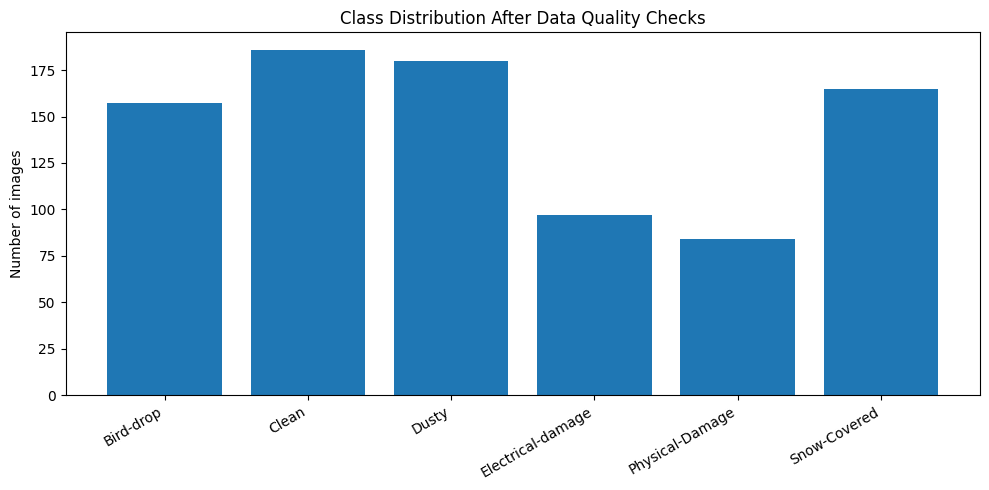

,count,percentage
label,,
Bird-drop,157,18.07
Clean,186,21.40
Dusty,180,20.71
Electrical-damage,97,11.16
Physical-Damage,84,9.67
Snow-Covered,165,18.99


Imbalance ratio (largest/smallest): 2.214
Imbalance handling activated: True


In [6]:
# 6A. EDA — class distribution
class_counts = clean_df["label"].value_counts().reindex(CLASS_NAMES)

plt.figure(figsize=(10, 5))
plt.bar(class_counts.index, class_counts.values)
plt.xticks(rotation=30, ha="right")
plt.ylabel("Number of images")
plt.title("Class Distribution After Data Quality Checks")
plt.tight_layout()
plt.savefig(FIG_DIR / "eda_class_distribution.png", dpi=180, bbox_inches="tight")
plt.show()

summary = pd.DataFrame({
    "count": class_counts,
    "percentage": (class_counts / class_counts.sum() * 100).round(2)
})
display(summary)

imbalance_ratio = class_counts.max() / class_counts.min()
USE_IMBALANCE_HANDLING = imbalance_ratio > IMBALANCE_RATIO_THRESHOLD
print(f"Imbalance ratio (largest/smallest): {imbalance_ratio:.3f}")
print("Imbalance handling activated:", USE_IMBALANCE_HANDLING)

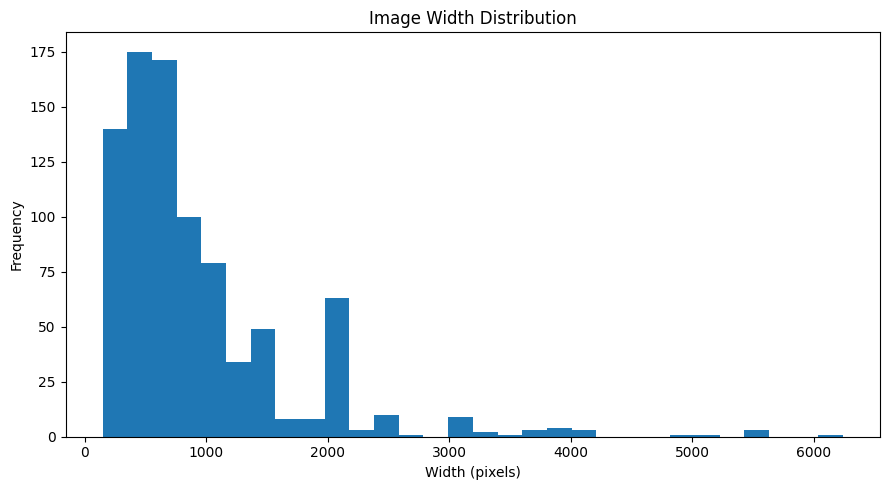

In [7]:
# 6B. EDA — image width distribution
plt.figure(figsize=(9, 5))
plt.hist(clean_df["width"].dropna(), bins=30)
plt.xlabel("Width (pixels)")
plt.ylabel("Frequency")
plt.title("Image Width Distribution")
plt.tight_layout()
plt.savefig(FIG_DIR / "eda_width_distribution.png", dpi=180, bbox_inches="tight")
plt.show()

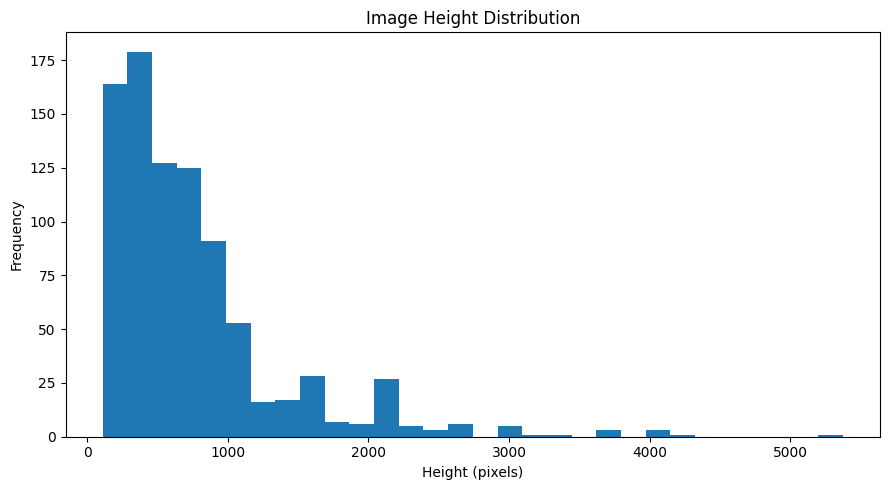

In [8]:
# 6C. EDA — image height distribution
plt.figure(figsize=(9, 5))
plt.hist(clean_df["height"].dropna(), bins=30)
plt.xlabel("Height (pixels)")
plt.ylabel("Frequency")
plt.title("Image Height Distribution")
plt.tight_layout()
plt.savefig(FIG_DIR / "eda_height_distribution.png", dpi=180, bbox_inches="tight")
plt.show()

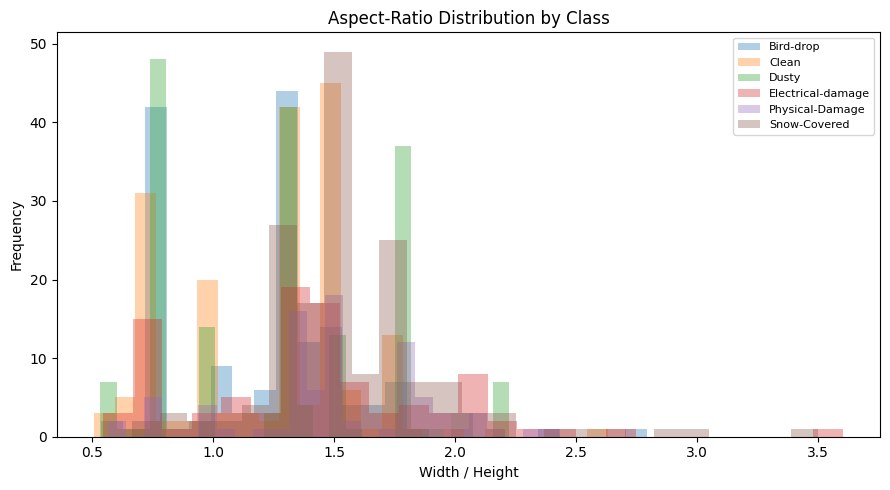

In [9]:
# 6D. EDA — aspect-ratio distribution
plt.figure(figsize=(9, 5))
for label in CLASS_NAMES:
    vals = clean_df.loc[clean_df["label"] == label, "aspect_ratio"].dropna()
    plt.hist(vals, bins=25, alpha=0.35, label=label)
plt.xlabel("Width / Height")
plt.ylabel("Frequency")
plt.title("Aspect-Ratio Distribution by Class")
plt.legend(fontsize=8)
plt.tight_layout()
plt.savefig(FIG_DIR / "eda_aspect_ratio_by_class.png", dpi=180, bbox_inches="tight")
plt.show()

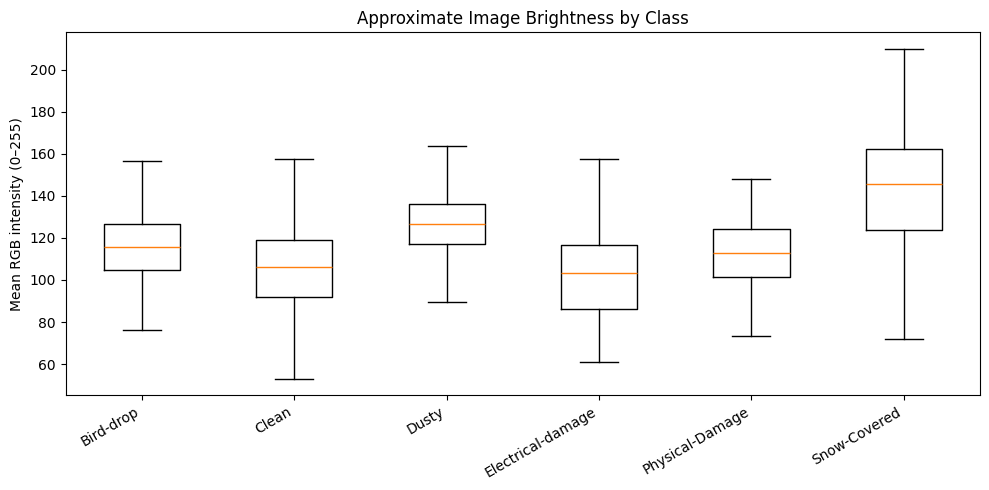

In [10]:
# 6E. EDA — brightness distribution by class
brightness_data = [
    clean_df.loc[clean_df["label"] == label, "brightness"].dropna().values
    for label in CLASS_NAMES
]

plt.figure(figsize=(10, 5))
plt.boxplot(brightness_data, tick_labels=CLASS_NAMES, showfliers=False)
plt.xticks(rotation=30, ha="right")
plt.ylabel("Mean RGB intensity (0–255)")
plt.title("Approximate Image Brightness by Class")
plt.tight_layout()
plt.savefig(FIG_DIR / "eda_brightness_by_class.png", dpi=180, bbox_inches="tight")
plt.show()

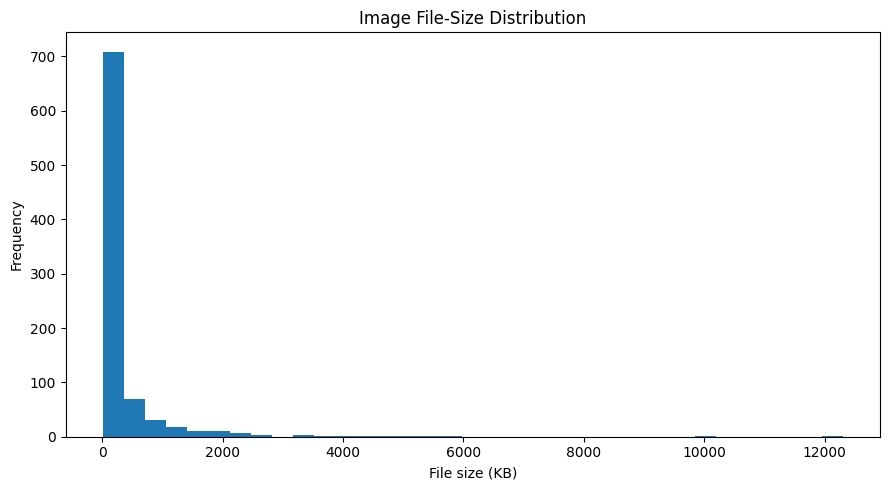

In [11]:
# 6F. EDA — file-size distribution
plt.figure(figsize=(9, 5))
plt.hist(clean_df["file_size_kb"], bins=35)
plt.xlabel("File size (KB)")
plt.ylabel("Frequency")
plt.title("Image File-Size Distribution")
plt.tight_layout()
plt.savefig(FIG_DIR / "eda_file_size_distribution.png", dpi=180, bbox_inches="tight")
plt.show()

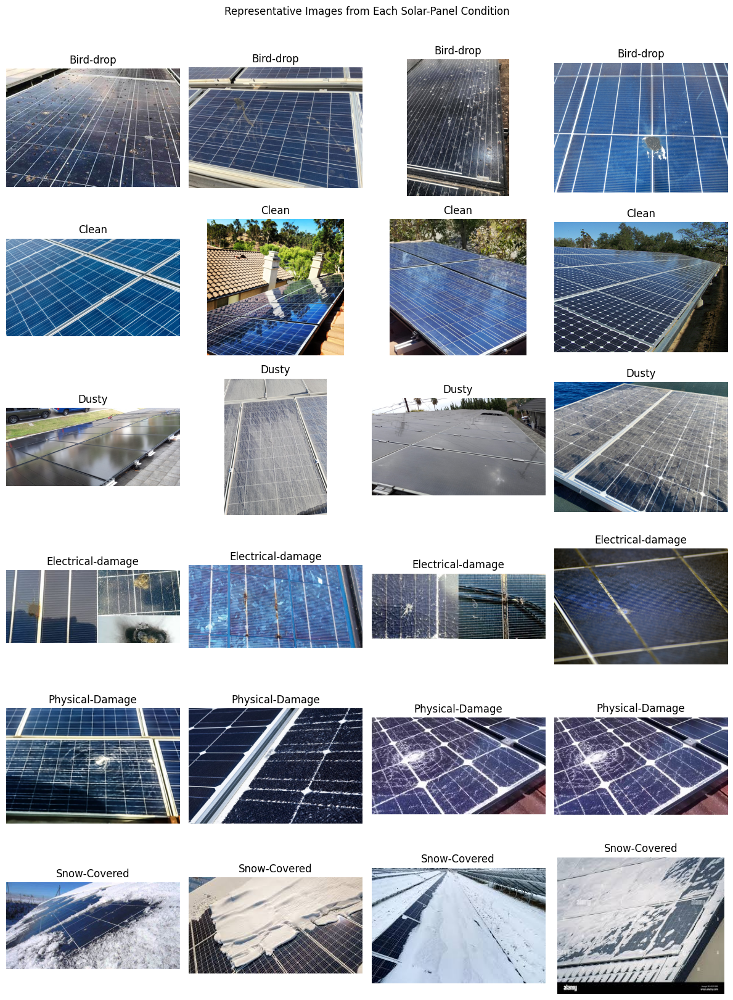

In [12]:
# 6G. EDA — representative image montage
samples_per_class = 4
fig, axes = plt.subplots(len(CLASS_NAMES), samples_per_class, figsize=(12, 16))
rng = np.random.default_rng(SEED)

for r, label in enumerate(CLASS_NAMES):
    subset = clean_df[clean_df["label"] == label]
    n = min(samples_per_class, len(subset))
    chosen = subset.sample(n=n, random_state=SEED)
    chosen_paths = chosen["path"].tolist()

    for c in range(samples_per_class):
        ax = axes[r, c]
        ax.axis("off")
        if c < len(chosen_paths):
            with Image.open(chosen_paths[c]) as im:
                ax.imshow(im.convert("RGB"))
            ax.set_title(label)

plt.suptitle("Representative Images from Each Solar-Panel Condition", y=1.01)
plt.tight_layout()
plt.savefig(FIG_DIR / "eda_sample_grid.png", dpi=180, bbox_inches="tight")
plt.show()

## 7. Stratified 80:10:10 split

The split is created from the **deduplicated valid-image manifest**, not by independently asking a data loader to construct training and validation subsets. This avoids accidental overlap.

- 80% training
- 10% validation
- 10% held-out test

The test split is not used for hyperparameter tuning or model selection.

In [13]:
# 7A. Create stratified 80:10:10 split
train_df, temp_df = train_test_split(
    clean_df,
    test_size=0.20,
    random_state=SEED,
    stratify=clean_df["label"],
)

val_df, test_df = train_test_split(
    temp_df,
    test_size=0.50,
    random_state=SEED,
    stratify=temp_df["label"],
)

train_df = train_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

for name, df_ in [("train", train_df), ("val", val_df), ("test", test_df)]:
    df_.to_csv(ARTIFACT_DIR / f"{name}_manifest.csv", index=False)

print("Split sizes")
print("Train:", len(train_df), f"({len(train_df)/len(clean_df):.1%})")
print("Val:  ", len(val_df), f"({len(val_df)/len(clean_df):.1%})")
print("Test: ", len(test_df), f"({len(test_df)/len(clean_df):.1%})")

# Leakage checks
assert set(train_df.sha256).isdisjoint(set(val_df.sha256))
assert set(train_df.sha256).isdisjoint(set(test_df.sha256))
assert set(val_df.sha256).isdisjoint(set(test_df.sha256))
print("Hash-based split overlap check: PASSED")

Split sizes
Train: 695 (80.0%)
Val:   87 (10.0%)
Test:  87 (10.0%)
Hash-based split overlap check: PASSED


,Train,Validation,Test
label,,,
Bird-drop,125,16,16
Clean,149,18,19
Dusty,144,18,18
Electrical-damage,78,10,9
Physical-Damage,67,8,9
Snow-Covered,132,17,16


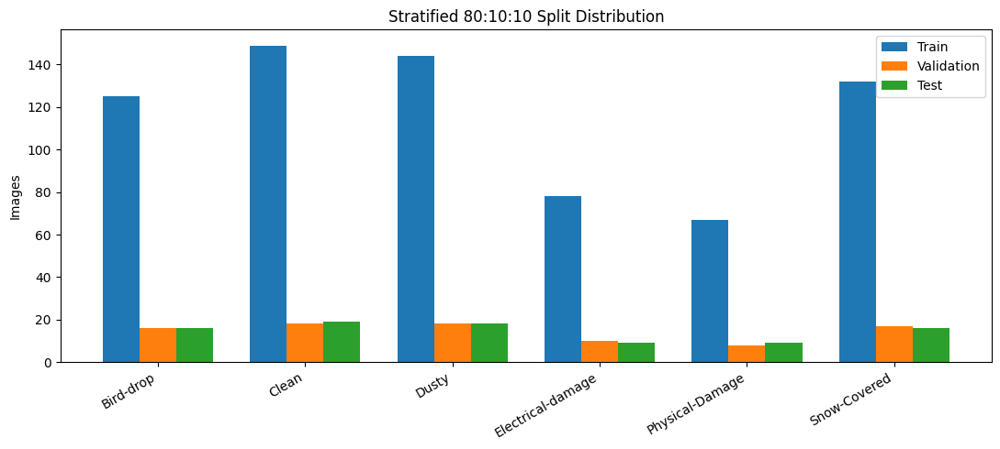

In [14]:
# 7B. Visualise class counts across splits
split_counts = pd.DataFrame({
    "Train": train_df["label"].value_counts().reindex(CLASS_NAMES).fillna(0),
    "Validation": val_df["label"].value_counts().reindex(CLASS_NAMES).fillna(0),
    "Test": test_df["label"].value_counts().reindex(CLASS_NAMES).fillna(0),
})

display(split_counts)

x = np.arange(len(CLASS_NAMES))
width = 0.25

plt.figure(figsize=(11, 5))
plt.bar(x - width, split_counts["Train"], width, label="Train")
plt.bar(x, split_counts["Validation"], width, label="Validation")
plt.bar(x + width, split_counts["Test"], width, label="Test")
plt.xticks(x, CLASS_NAMES, rotation=30, ha="right")
plt.ylabel("Images")
plt.title("Stratified 80:10:10 Split Distribution")
plt.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "split_distribution.png", dpi=180, bbox_inches="tight")
plt.show()

## 8. PyTorch input pipeline

Only the **training transform** contains random augmentation. Validation and test use deterministic resizing and ImageNet normalization.

The same `224×224` input resolution is used for ResNet-50, EfficientNet-B0 and YOLOv8 classification to keep the comparison reasonably consistent.

In [15]:
# 8A. Training-only augmentation and deterministic evaluation preprocessing
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std  = [0.229, 0.224, 0.225]

train_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.85, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=8),
    transforms.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.10),
    transforms.ToTensor(),
    transforms.Normalize(imagenet_mean, imagenet_std),
])

eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(imagenet_mean, imagenet_std),
])

class SolarPanelDataset(Dataset):
    def __init__(self, frame, transform):
        self.frame = frame.reset_index(drop=True)
        self.transform = transform
        self.class_to_idx = {c: i for i, c in enumerate(CLASS_NAMES)}

    def __len__(self):
        return len(self.frame)

    def __getitem__(self, idx):
        row = self.frame.iloc[idx]
        with Image.open(row["path"]) as im:
            img = im.convert("RGB")
        x = self.transform(img)
        y = self.class_to_idx[row["label"]]
        return x, y, row["path"]

train_ds = SolarPanelDataset(train_df, train_transform)
val_ds   = SolarPanelDataset(val_df, eval_transform)
test_ds  = SolarPanelDataset(test_df, eval_transform)

train_loader = DataLoader(
    train_ds, batch_size=BATCH_SIZE, shuffle=True,
    num_workers=NUM_WORKERS, pin_memory=DEVICE.type == "cuda"
)
val_loader = DataLoader(
    val_ds, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=NUM_WORKERS, pin_memory=DEVICE.type == "cuda"
)
test_loader = DataLoader(
    test_ds, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=NUM_WORKERS, pin_memory=DEVICE.type == "cuda"
)

print("PyTorch data loaders ready")

PyTorch data loaders ready


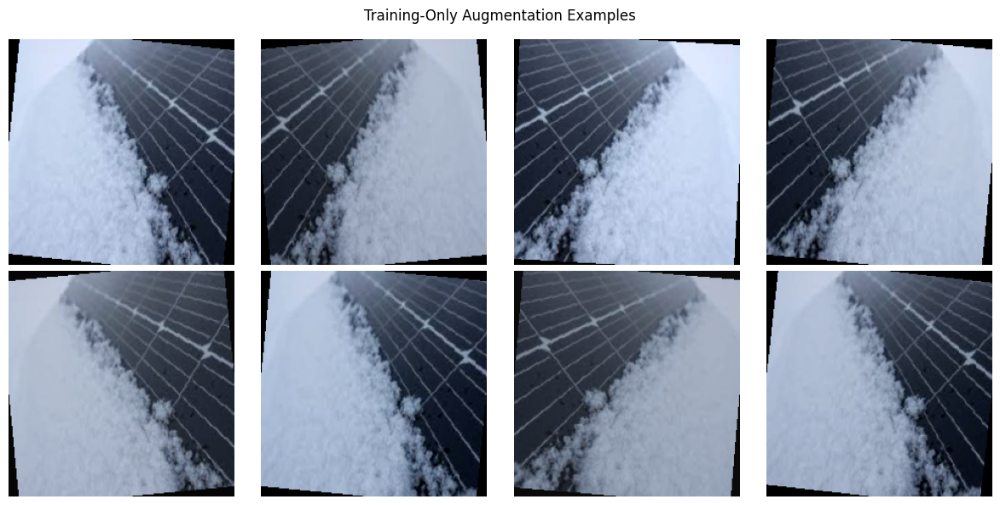

In [16]:
# 8B. Visualise examples of training-only augmentation
example_path = train_df.sample(1, random_state=SEED)["path"].iloc[0]
with Image.open(example_path) as im:
    example_img = im.convert("RGB")

def denormalize_tensor(t):
    mean = torch.tensor(imagenet_mean).view(3, 1, 1)
    std = torch.tensor(imagenet_std).view(3, 1, 1)
    return (t.cpu() * std + mean).clamp(0, 1)

fig, axes = plt.subplots(2, 4, figsize=(12, 6))
for ax in axes.flat:
    aug = denormalize_tensor(train_transform(example_img)).permute(1, 2, 0).numpy()
    ax.imshow(aug)
    ax.axis("off")
plt.suptitle("Training-Only Augmentation Examples")
plt.tight_layout()
plt.savefig(FIG_DIR / "training_augmentation_examples.png", dpi=180, bbox_inches="tight")
plt.show()

In [17]:
# 8C. Configure class weighting when required

train_counts = train_df["label"].value_counts().reindex(CLASS_NAMES)
weights = len(train_df) / (len(CLASS_NAMES) * train_counts.values.astype(float))

class_weight_table = pd.DataFrame({
    "class": CLASS_NAMES,
    "training_count": train_counts.values,
    "calculated_weight": weights.round(4),
})

display(class_weight_table)
class_weight_table.to_csv(ARTIFACT_DIR / "training_class_weights.csv", index=False)

if USE_IMBALANCE_HANDLING:
    class_weight_tensor = torch.tensor(weights, dtype=torch.float32).to(DEVICE)
    criterion = nn.CrossEntropyLoss(weight=class_weight_tensor)
    print("Weighted cross-entropy enabled.")
else:
    criterion = nn.CrossEntropyLoss()
    print("Ordinary cross-entropy used because material imbalance was not detected.")

,class,training_count,calculated_weight
0,Bird-drop,125,0.9267
1,Clean,149,0.7774
2,Dusty,144,0.8044
3,Electrical-damage,78,1.4850
4,Physical-Damage,67,1.7289
5,Snow-Covered,132,0.8775


Weighted cross-entropy enabled.


## 9. ResNet-50 and EfficientNet-B0 transfer learning

Both models use ImageNet-pretrained weights.

Training is performed in two stages:

1. **Classifier-head training** with the pretrained feature extractor frozen.
2. **Controlled fine-tuning** of the final feature block(s) using a lower learning rate.

Early stopping uses **validation macro-F1**, which is more informative than accuracy alone when class counts differ.

In [18]:
# 9A. Shared model/evaluation utilities
def build_torch_model(model_name, num_classes=len(CLASS_NAMES), pretrained=True):
    if model_name == "ResNet50":
        try:
            model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT if pretrained else None)
        except Exception as e:
            raise RuntimeError(
                "Could not load ImageNet-pretrained ResNet50 weights. "
                "Enable Kaggle Internet and rerun this cell."
            ) from e

        for p in model.parameters():
            p.requires_grad = False
        in_features = model.fc.in_features
        model.fc = nn.Sequential(
            nn.Dropout(0.30),
            nn.Linear(in_features, num_classes)
        )

    elif model_name == "EfficientNetB0":
        try:
            model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.DEFAULT if pretrained else None)
        except Exception as e:
            raise RuntimeError(
                "Could not load ImageNet-pretrained EfficientNet-B0 weights. "
                "Enable Kaggle Internet and rerun this cell."
            ) from e

        for p in model.parameters():
            p.requires_grad = False
        in_features = model.classifier[1].in_features
        model.classifier = nn.Sequential(
            nn.Dropout(0.30),
            nn.Linear(in_features, num_classes)
        )
    else:
        raise ValueError(model_name)

    return model.to(DEVICE)


def unfreeze_final_block(model, model_name):
    if model_name == "ResNet50":
        for p in model.layer4.parameters():
            p.requires_grad = True
        for p in model.fc.parameters():
            p.requires_grad = True

    elif model_name == "EfficientNetB0":
        # Fine-tune only the last two feature blocks + classifier.
        for block in list(model.features.children())[-2:]:
            for p in block.parameters():
                p.requires_grad = True
        for p in model.classifier.parameters():
            p.requires_grad = True


@torch.no_grad()
def predict_torch(model, loader):
    model.eval()
    y_true, y_pred, probs_all, paths_all = [], [], [], []

    for x, y, paths in loader:
        x = x.to(DEVICE, non_blocking=True)
        logits = model(x)
        probs = torch.softmax(logits, dim=1).cpu().numpy()
        pred = probs.argmax(axis=1)

        y_true.extend(y.numpy().tolist())
        y_pred.extend(pred.tolist())
        probs_all.append(probs)
        paths_all.extend(paths)

    probs_all = np.concatenate(probs_all, axis=0)
    return np.array(y_true), np.array(y_pred), probs_all, paths_all


def metric_summary(y_true, y_pred):
    p_macro, r_macro, f1_macro, _ = precision_recall_fscore_support(
        y_true, y_pred, average="macro", zero_division=0
    )
    p_weighted, r_weighted, f1_weighted, _ = precision_recall_fscore_support(
        y_true, y_pred, average="weighted", zero_division=0
    )
    return {
        "accuracy": accuracy_score(y_true, y_pred),
        "balanced_accuracy": balanced_accuracy_score(y_true, y_pred),
        "macro_precision": p_macro,
        "macro_recall": r_macro,
        "macro_f1": f1_macro,
        "weighted_f1": f1_weighted,
    }


@torch.no_grad()
def eval_loss_and_metrics(model, loader, loss_fn):
    model.eval()
    running_loss = 0.0
    n = 0
    y_true, y_pred = [], []

    for x, y, _ in loader:
        x = x.to(DEVICE, non_blocking=True)
        y_dev = y.to(DEVICE, non_blocking=True)
        logits = model(x)
        loss = loss_fn(logits, y_dev)

        bs = x.size(0)
        running_loss += float(loss.item()) * bs
        n += bs

        pred = logits.argmax(dim=1).cpu().numpy()
        y_true.extend(y.numpy().tolist())
        y_pred.extend(pred.tolist())

    metrics = metric_summary(np.array(y_true), np.array(y_pred))
    metrics["loss"] = running_loss / max(n, 1)
    return metrics

In [19]:
# 9B. Two-stage training function
def train_torch_model(model_name):
    model = build_torch_model(model_name)
    ckpt_path = CKPT_DIR / f"{model_name}_best.pt"

    history = []
    best_f1 = -np.inf
    wait = 0

    phases = [
        ("head", HEAD_EPOCHS, 1e-3),
        ("finetune", FINETUNE_EPOCHS, 1e-4),
    ]

    global_epoch = 0

    for phase_name, n_epochs, lr in phases:
        if phase_name == "finetune":
            unfreeze_final_block(model, model_name)

        optimizer = torch.optim.AdamW(
            [p for p in model.parameters() if p.requires_grad],
            lr=lr,
            weight_decay=1e-4,
        )

        for _ in range(n_epochs):
            global_epoch += 1
            model.train()
            running_loss = 0.0
            n_seen = 0
            train_true, train_pred = [], []

            for x, y, _paths in train_loader:
                x = x.to(DEVICE, non_blocking=True)
                y_dev = y.to(DEVICE, non_blocking=True)

                optimizer.zero_grad(set_to_none=True)
                logits = model(x)
                loss = criterion(logits, y_dev)
                loss.backward()
                optimizer.step()

                bs = x.size(0)
                running_loss += float(loss.item()) * bs
                n_seen += bs
                train_true.extend(y.numpy().tolist())
                train_pred.extend(logits.argmax(dim=1).detach().cpu().numpy().tolist())

            train_metrics = metric_summary(np.array(train_true), np.array(train_pred))
            train_metrics["loss"] = running_loss / max(n_seen, 1)
            val_metrics = eval_loss_and_metrics(model, val_loader, criterion)

            row = {
                "epoch": global_epoch,
                "phase": phase_name,
                "train_loss": train_metrics["loss"],
                "train_accuracy": train_metrics["accuracy"],
                "train_macro_f1": train_metrics["macro_f1"],
                "val_loss": val_metrics["loss"],
                "val_accuracy": val_metrics["accuracy"],
                "val_macro_f1": val_metrics["macro_f1"],
            }
            history.append(row)

            print(
                f"{model_name:15s} | epoch {global_epoch:02d} | {phase_name:8s} | "
                f"train loss {row['train_loss']:.4f} | "
                f"val acc {row['val_accuracy']:.4f} | "
                f"val macro-F1 {row['val_macro_f1']:.4f}"
            )

            if row["val_macro_f1"] > best_f1 + 1e-4:
                best_f1 = row["val_macro_f1"]
                wait = 0
                torch.save({
                    "arch": model_name,
                    "state_dict": model.state_dict(),
                    "class_names": CLASS_NAMES,
                    "img_size": IMG_SIZE,
                    "val_macro_f1": best_f1,
                }, ckpt_path)
            else:
                wait += 1

            if wait >= PATIENCE:
                print(f"Early stopping {model_name} at epoch {global_epoch}.")
                break

        # Reset patience at the start of fine-tuning so that it gets a fair opportunity.
        wait = 0

    # Reload best overall validation checkpoint
    saved = torch.load(ckpt_path, map_location=DEVICE)
    model.load_state_dict(saved["state_dict"])
    model.eval()

    hist_df = pd.DataFrame(history)
    hist_df.to_csv(ARTIFACT_DIR / f"{model_name}_training_history.csv", index=False)

    return model, hist_df, ckpt_path

In [20]:
# 9C. Train ResNet-50
resnet_model, resnet_history, resnet_ckpt = train_torch_model("ResNet50")
print("Saved:", resnet_ckpt)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 202MB/s]


ResNet50        | epoch 01 | head     | train loss 1.6247 | val acc 0.6897 | val macro-F1 0.6369
ResNet50        | epoch 02 | head     | train loss 1.2709 | val acc 0.6322 | val macro-F1 0.5777
ResNet50        | epoch 03 | head     | train loss 1.0604 | val acc 0.7471 | val macro-F1 0.7366
ResNet50        | epoch 04 | head     | train loss 0.8792 | val acc 0.7241 | val macro-F1 0.6984
ResNet50        | epoch 05 | head     | train loss 0.8255 | val acc 0.7126 | val macro-F1 0.6898
ResNet50        | epoch 06 | head     | train loss 0.7343 | val acc 0.7586 | val macro-F1 0.7478
ResNet50        | epoch 07 | finetune | train loss 0.6162 | val acc 0.7586 | val macro-F1 0.7539
ResNet50        | epoch 08 | finetune | train loss 0.3945 | val acc 0.7816 | val macro-F1 0.7746
ResNet50        | epoch 09 | finetune | train loss 0.2711 | val acc 0.8161 | val macro-F1 0.8078
ResNet50        | epoch 10 | finetune | train loss 0.1981 | val acc 0.8161 | val macro-F1 0.8131
ResNet50        | epoch 11 | f

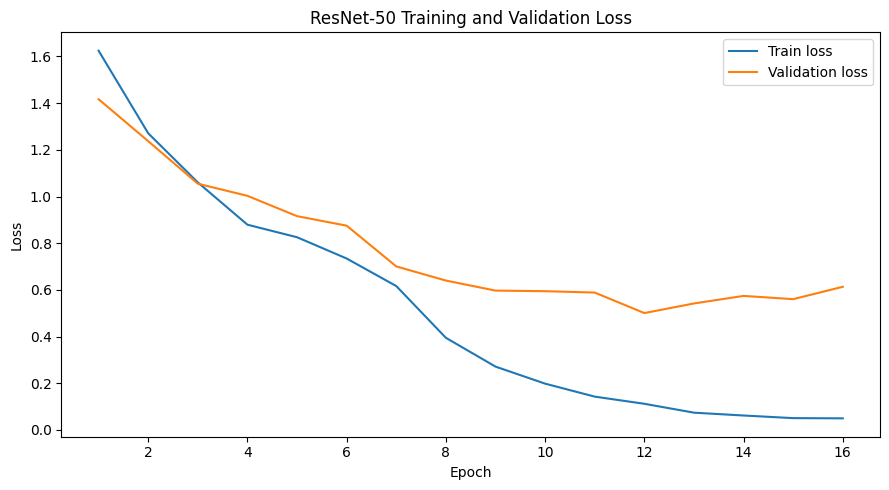

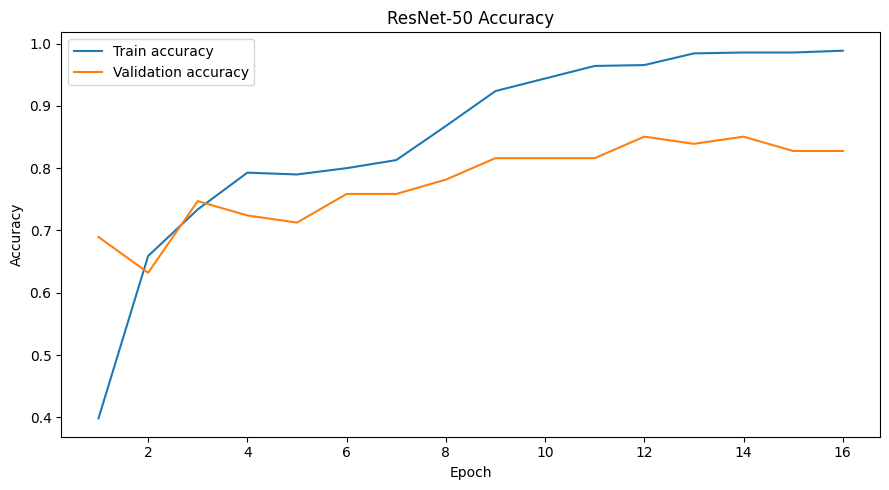

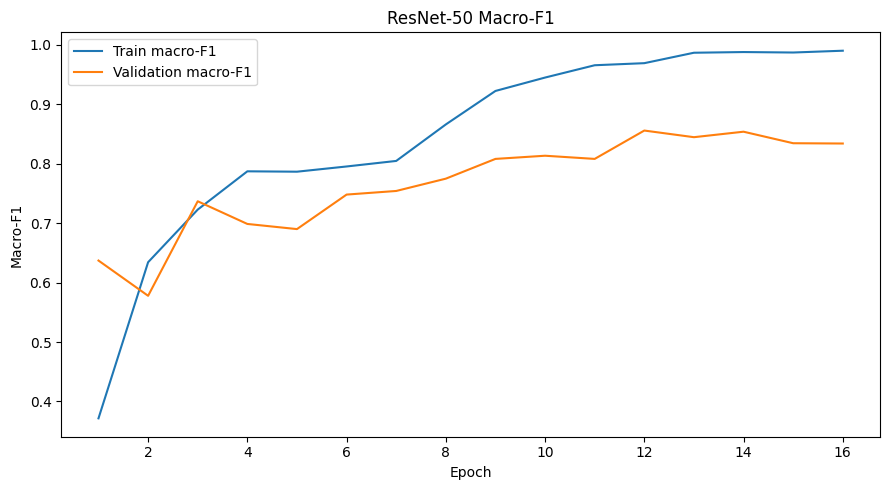

In [21]:
# 9D. ResNet-50 training curves
plt.figure(figsize=(9, 5))
plt.plot(resnet_history["epoch"], resnet_history["train_loss"], label="Train loss")
plt.plot(resnet_history["epoch"], resnet_history["val_loss"], label="Validation loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("ResNet-50 Training and Validation Loss")
plt.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "resnet_loss_curve.png", dpi=180, bbox_inches="tight")
plt.show()

plt.figure(figsize=(9, 5))
plt.plot(resnet_history["epoch"], resnet_history["train_accuracy"], label="Train accuracy")
plt.plot(resnet_history["epoch"], resnet_history["val_accuracy"], label="Validation accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("ResNet-50 Accuracy")
plt.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "resnet_accuracy_curve.png", dpi=180, bbox_inches="tight")
plt.show()

plt.figure(figsize=(9, 5))
plt.plot(resnet_history["epoch"], resnet_history["train_macro_f1"], label="Train macro-F1")
plt.plot(resnet_history["epoch"], resnet_history["val_macro_f1"], label="Validation macro-F1")
plt.xlabel("Epoch")
plt.ylabel("Macro-F1")
plt.title("ResNet-50 Macro-F1")
plt.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "resnet_macro_f1_curve.png", dpi=180, bbox_inches="tight")
plt.show()

In [22]:
# Free GPU memory before the next architecture.
del resnet_model
gc.collect()
if DEVICE.type == "cuda":
    torch.cuda.empty_cache()

In [23]:
# 9E. Train EfficientNet-B0
eff_model, eff_history, eff_ckpt = train_torch_model("EfficientNetB0")
print("Saved:", eff_ckpt)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 137MB/s]


EfficientNetB0  | epoch 01 | head     | train loss 1.6106 | val acc 0.5977 | val macro-F1 0.5581
EfficientNetB0  | epoch 02 | head     | train loss 1.1934 | val acc 0.6437 | val macro-F1 0.6408
EfficientNetB0  | epoch 03 | head     | train loss 1.0035 | val acc 0.6322 | val macro-F1 0.6157
EfficientNetB0  | epoch 04 | head     | train loss 0.8808 | val acc 0.6782 | val macro-F1 0.6746
EfficientNetB0  | epoch 05 | head     | train loss 0.8004 | val acc 0.6667 | val macro-F1 0.6509
EfficientNetB0  | epoch 06 | head     | train loss 0.7581 | val acc 0.6897 | val macro-F1 0.6671
EfficientNetB0  | epoch 07 | finetune | train loss 0.7239 | val acc 0.7126 | val macro-F1 0.6961
EfficientNetB0  | epoch 08 | finetune | train loss 0.6374 | val acc 0.7701 | val macro-F1 0.7678
EfficientNetB0  | epoch 09 | finetune | train loss 0.5631 | val acc 0.7471 | val macro-F1 0.7553
EfficientNetB0  | epoch 10 | finetune | train loss 0.5299 | val acc 0.7586 | val macro-F1 0.7605
EfficientNetB0  | epoch 11 | f

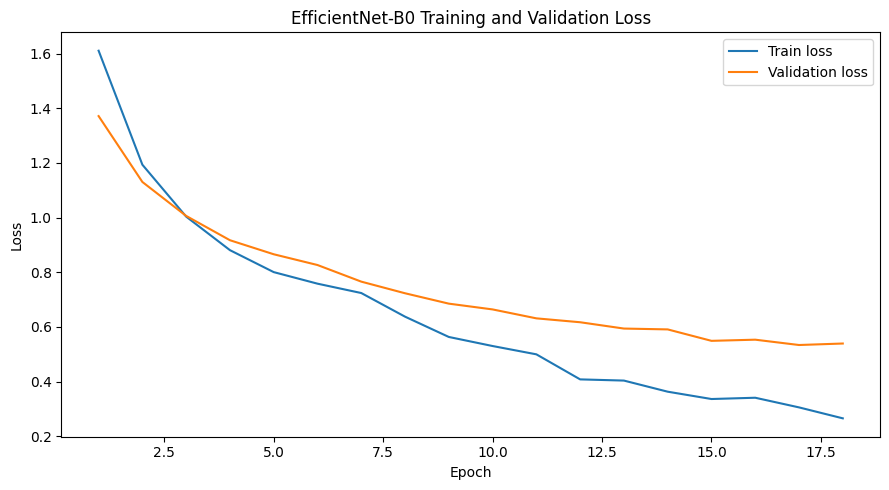

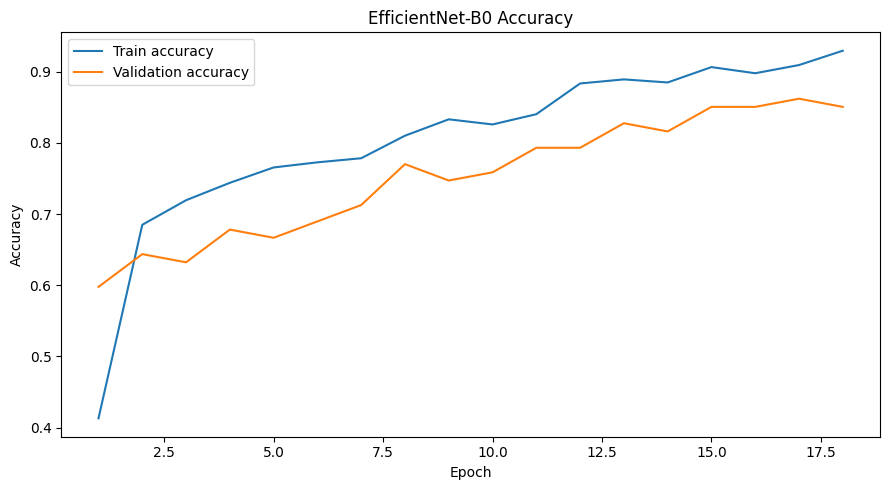

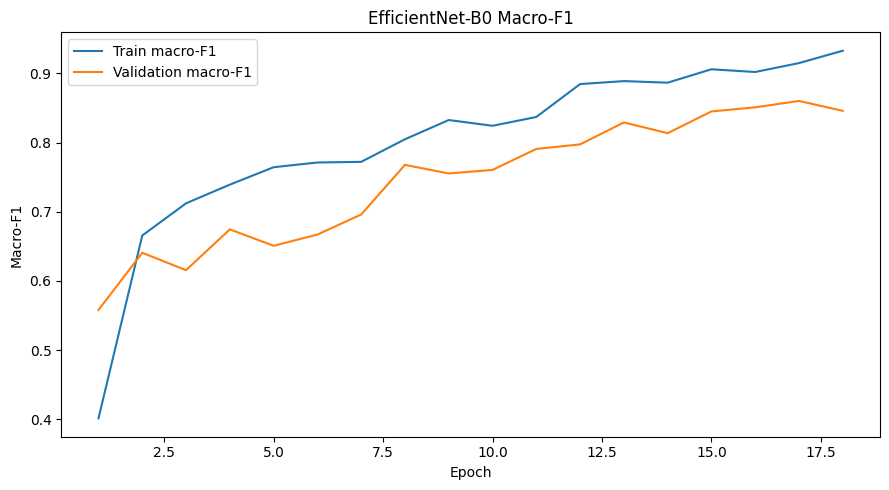

In [24]:
# 9F. EfficientNet-B0 training curves
plt.figure(figsize=(9, 5))
plt.plot(eff_history["epoch"], eff_history["train_loss"], label="Train loss")
plt.plot(eff_history["epoch"], eff_history["val_loss"], label="Validation loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("EfficientNet-B0 Training and Validation Loss")
plt.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "efficientnet_loss_curve.png", dpi=180, bbox_inches="tight")
plt.show()

plt.figure(figsize=(9, 5))
plt.plot(eff_history["epoch"], eff_history["train_accuracy"], label="Train accuracy")
plt.plot(eff_history["epoch"], eff_history["val_accuracy"], label="Validation accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("EfficientNet-B0 Accuracy")
plt.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "efficientnet_accuracy_curve.png", dpi=180, bbox_inches="tight")
plt.show()

plt.figure(figsize=(9, 5))
plt.plot(eff_history["epoch"], eff_history["train_macro_f1"], label="Train macro-F1")
plt.plot(eff_history["epoch"], eff_history["val_macro_f1"], label="Validation macro-F1")
plt.xlabel("Epoch")
plt.ylabel("Macro-F1")
plt.title("EfficientNet-B0 Macro-F1")
plt.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "efficientnet_macro_f1_curve.png", dpi=180, bbox_inches="tight")
plt.show()

In [25]:
# Free GPU memory before YOLO.
del eff_model
gc.collect()
if DEVICE.type == "cuda":
    torch.cuda.empty_cache()

## 10. Prepare YOLOv8 Classification data

Ultralytics classification expects folder-based splits. The notebook therefore copies the already-audited manifest into a new working directory.

If material class imbalance exists, **training only** is oversampled for YOLOv8. Validation and test remain untouched.

Copies—not symlinks—are used to avoid the read-only-file errors seen in some earlier Kaggle experiments.

In [26]:
# 10A. Prepare clean YOLO folder structure
if YOLO_DATA_DIR.exists():
    shutil.rmtree(YOLO_DATA_DIR)
YOLO_DATA_DIR.mkdir(parents=True, exist_ok=True)

def unique_copy(src, dst_dir, unique_token):
    dst_dir.mkdir(parents=True, exist_ok=True)
    src = Path(src)
    safe_name = f"{unique_token}_{src.name}"
    dst = dst_dir / safe_name
    shutil.copy2(src, dst)
    return dst

def export_split(frame, split_name):
    copied = []
    for i, row in frame.reset_index(drop=True).iterrows():
        token = hashlib.sha1(str(row["path"]).encode()).hexdigest()[:10]
        dst = unique_copy(row["path"], YOLO_DATA_DIR / split_name / row["label"], token)
        copied.append(str(dst))
    return copied

_ = export_split(val_df, "val")
_ = export_split(test_df, "test")

# Training split: original unique images first.
_ = export_split(train_df, "train")

# Optional training-only oversampling to the maximum class count.
if USE_IMBALANCE_HANDLING:
    target_n = int(train_df["label"].value_counts().max())
    rng = np.random.default_rng(SEED)

    for label in CLASS_NAMES:
        group = train_df[train_df["label"] == label].reset_index(drop=True)
        deficit = target_n - len(group)
        if deficit > 0:
            sampled_idx = rng.integers(0, len(group), size=deficit)
            for j, idx in enumerate(sampled_idx):
                src = group.iloc[int(idx)]["path"]
                token = f"oversample_{j:05d}_{hashlib.sha1(str(src).encode()).hexdigest()[:8]}"
                unique_copy(src, YOLO_DATA_DIR / "train" / label, token)

print("YOLO dataset prepared at:", YOLO_DATA_DIR)
for split in ["train", "val", "test"]:
    counts = {
        c: len([f for f in (YOLO_DATA_DIR / split / c).glob("*") if f.is_file()])
        for c in CLASS_NAMES
    }
    print(split, counts)

YOLO dataset prepared at: /kaggle/working/pv_urec1_final/yolo_dataset
train {'Bird-drop': 149, 'Clean': 149, 'Dusty': 149, 'Electrical-damage': 149, 'Physical-Damage': 149, 'Snow-Covered': 149}
val {'Bird-drop': 16, 'Clean': 18, 'Dusty': 18, 'Electrical-damage': 10, 'Physical-Damage': 8, 'Snow-Covered': 17}
test {'Bird-drop': 16, 'Clean': 19, 'Dusty': 18, 'Electrical-damage': 9, 'Physical-Damage': 9, 'Snow-Covered': 16}


In [27]:
# 10B. Train YOLOv8 Classification
yolo_model = YOLO(YOLO_BACKBONE)

yolo_results = yolo_model.train(
    data=str(YOLO_DATA_DIR),
    task="classify",
    imgsz=IMG_SIZE,
    epochs=YOLO_EPOCHS,
    batch=BATCH_SIZE,
    patience=YOLO_PATIENCE,
    optimizer="AdamW",
    lr0=1e-3,
    weight_decay=5e-4,
    dropout=0.20,

    # Moderate training-only augmentation
    fliplr=0.5,
    degrees=8.0,
    translate=0.05,
    scale=0.10,
    hsv_h=0.01,
    hsv_s=0.20,
    hsv_v=0.20,
    erasing=0.20,
    mixup=0.10,

    seed=SEED,
    deterministic=True,
    pretrained=True,
    device=0 if DEVICE.type == "cuda" else "cpu",
    workers=NUM_WORKERS,
    project=str(YOLO_RUN_DIR),
    name="yolov8m_cls",
    exist_ok=True,
    verbose=True,
)

yolo_best = YOLO_RUN_DIR / "yolov8m_cls" / "weights" / "best.pt"
if not yolo_best.exists():
    raise FileNotFoundError(f"YOLO best checkpoint not found: {yolo_best}")
print("YOLO best checkpoint:", yolo_best)

Ultralytics 8.4.131 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/pv_urec1_final/yolo_dataset, degrees=8.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.2, dynamic=False, embed=None, end2end=None, epochs=40, erasing=0.2, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.01, hsv_s=0.2, hsv_v=0.2, imgsz=224, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8m-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov8m_cls, n

,epoch,time,train/loss,metrics/accuracy_top1,metrics/accuracy_top5,val/loss,lr/pg0,lr/pg1,lr/pg2
17,18,245.032,0.04671,0.86207,1.0,0.41879,0.000579,0.000579,0.000579
18,19,259.552,0.05543,0.86207,1.0,0.61806,0.000554,0.000554,0.000554
19,20,272.822,0.02760,0.89655,1.0,0.49995,0.000530,0.000530,0.000530
20,21,286.300,0.02538,0.88506,1.0,0.53729,0.000505,0.000505,0.000505
21,22,298.860,0.03109,0.87356,1.0,0.66122,0.000480,0.000480,0.000480


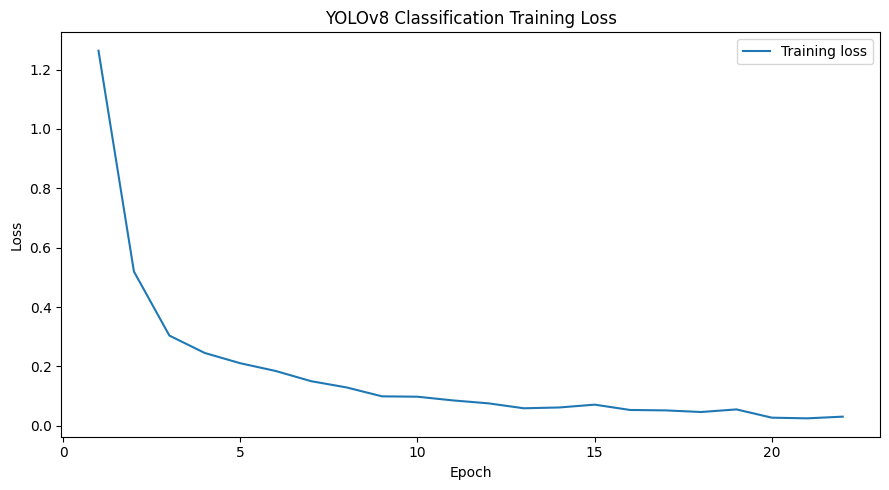

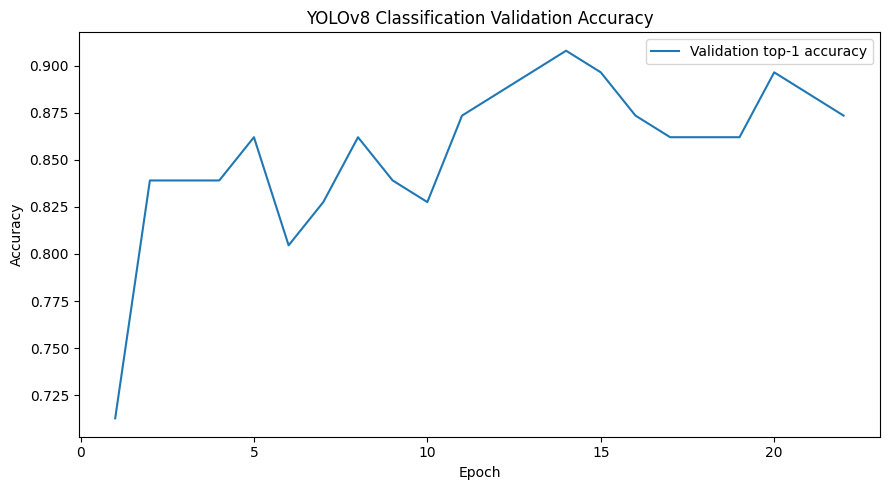

In [28]:
# 10C. YOLO training curves from results.csv
yolo_results_csv = YOLO_RUN_DIR / "yolov8m_cls" / "results.csv"
yolo_hist = pd.read_csv(yolo_results_csv)
yolo_hist.columns = [c.strip() for c in yolo_hist.columns]
display(yolo_hist.tail())

epoch_col = "epoch"

loss_cols = [c for c in yolo_hist.columns if "train/loss" in c or c == "train/loss"]
if not loss_cols:
    loss_cols = [c for c in yolo_hist.columns if "loss" in c and "train" in c]

if loss_cols:
    plt.figure(figsize=(9, 5))
    plt.plot(yolo_hist[epoch_col], yolo_hist[loss_cols[0]], label="Training loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("YOLOv8 Classification Training Loss")
    plt.legend()
    plt.tight_layout()
    plt.savefig(FIG_DIR / "yolo_training_loss.png", dpi=180, bbox_inches="tight")
    plt.show()

acc_cols = [c for c in yolo_hist.columns if "top1" in c.lower()]
if acc_cols:
    plt.figure(figsize=(9, 5))
    plt.plot(yolo_hist[epoch_col], yolo_hist[acc_cols[0]], label="Validation top-1 accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title("YOLOv8 Classification Validation Accuracy")
    plt.legend()
    plt.tight_layout()
    plt.savefig(FIG_DIR / "yolo_validation_accuracy.png", dpi=180, bbox_inches="tight")
    plt.show()

## 11. Validation-only model comparison

The next section evaluates the fixed checkpoints on the validation set and measures:

- accuracy
- macro precision
- macro recall
- macro-F1
- weighted-F1
- model size
- end-to-end per-image inference latency

**Selection rule:** performance is primary. Models within **1 percentage point** of the best validation macro-F1 are considered practically tied; among those, the model with lower validation latency is preferred, with model size as the next tie-breaker.

The held-out test set is still untouched at this stage.

In [29]:
# 11A. Checkpoint loaders and latency utilities
def load_torch_checkpoint(path):
    saved = torch.load(path, map_location=DEVICE)
    model = build_torch_model(saved["arch"], num_classes=len(saved["class_names"]), pretrained=False)
    model.load_state_dict(saved["state_dict"])
    model.eval()
    return model, saved


def torch_end_to_end_latency_ms(model, frame, n=50):
    subset = frame.head(min(n, len(frame)))
    times = []

    # warm-up
    for p in subset["path"].head(min(5, len(subset))):
        with Image.open(p) as im:
            x = eval_transform(im.convert("RGB")).unsqueeze(0).to(DEVICE)
        with torch.no_grad():
            _ = model(x)
        if DEVICE.type == "cuda":
            torch.cuda.synchronize()

    for p in subset["path"]:
        t0 = time.perf_counter()
        with Image.open(p) as im:
            x = eval_transform(im.convert("RGB")).unsqueeze(0).to(DEVICE)
        with torch.no_grad():
            _ = model(x)
        if DEVICE.type == "cuda":
            torch.cuda.synchronize()
        times.append((time.perf_counter() - t0) * 1000)

    return float(np.median(times))


def yolo_predict_frame(model, frame):
    y_true = np.array([CLASS_NAMES.index(x) for x in frame["label"]], dtype=int)
    probs_aligned = []
    preds = []

    for p in frame["path"]:
        result = model.predict(
            source=str(p),
            imgsz=IMG_SIZE,
            verbose=False,
            device=0 if DEVICE.type == "cuda" else "cpu",
        )[0]

        raw = result.probs.data.detach().cpu().numpy()
        names = result.names

        aligned = np.zeros(len(CLASS_NAMES), dtype=np.float32)
        for raw_idx, class_name in names.items():
            if class_name not in CLASS_NAMES:
                raise ValueError(f"Unexpected YOLO class name: {class_name}")
            aligned[CLASS_NAMES.index(class_name)] = raw[int(raw_idx)]

        probs_aligned.append(aligned)
        preds.append(int(aligned.argmax()))

    return y_true, np.array(preds), np.stack(probs_aligned)


def yolo_end_to_end_latency_ms(model, frame, n=50):
    subset = frame.head(min(n, len(frame)))
    times = []

    # warm-up
    for p in subset["path"].head(min(5, len(subset))):
        _ = model.predict(
            source=str(p), imgsz=IMG_SIZE, verbose=False,
            device=0 if DEVICE.type == "cuda" else "cpu"
        )
        if DEVICE.type == "cuda":
            torch.cuda.synchronize()

    for p in subset["path"]:
        t0 = time.perf_counter()
        _ = model.predict(
            source=str(p), imgsz=IMG_SIZE, verbose=False,
            device=0 if DEVICE.type == "cuda" else "cpu"
        )
        if DEVICE.type == "cuda":
            torch.cuda.synchronize()
        times.append((time.perf_counter() - t0) * 1000)

    return float(np.median(times))

In [30]:
# 11B. Validation metrics for ResNet-50 and EfficientNet-B0
validation_rows = []
val_predictions = {}

for model_name, ckpt in [
    ("ResNet50", resnet_ckpt),
    ("EfficientNetB0", eff_ckpt),
]:
    model, saved = load_torch_checkpoint(ckpt)
    y_true, y_pred, probs, paths = predict_torch(model, val_loader)
    metrics = metric_summary(y_true, y_pred)
    latency = torch_end_to_end_latency_ms(model, val_df)
    size_mb = Path(ckpt).stat().st_size / (1024 ** 2)

    validation_rows.append({
        "model": model_name,
        **{f"val_{k}": v for k, v in metrics.items()},
        "model_size_mb": size_mb,
        "inference_ms_per_image": latency,
    })
    val_predictions[model_name] = (y_true, y_pred, probs, paths)

    del model
    gc.collect()
    if DEVICE.type == "cuda":
        torch.cuda.empty_cache()

pd.DataFrame(validation_rows)

,model,val_accuracy,val_balanced_accuracy,val_macro_precision,val_macro_recall,val_macro_f1,val_weighted_f1,model_size_mb,inference_ms_per_image
0,ResNet50,0.850575,0.859709,0.861243,0.859709,0.855411,0.851978,90.028354,21.409695
1,EfficientNetB0,0.862069,0.854929,0.875315,0.854929,0.860168,0.863756,15.605918,21.807778


In [31]:
# 11C. Validation metrics for YOLOv8 Classification
best_yolo_model = YOLO(str(yolo_best))
y_true_y, y_pred_y, probs_y = yolo_predict_frame(best_yolo_model, val_df)
metrics_y = metric_summary(y_true_y, y_pred_y)
latency_y = yolo_end_to_end_latency_ms(best_yolo_model, val_df)
size_y = yolo_best.stat().st_size / (1024 ** 2)

validation_rows.append({
    "model": "YOLOv8-Classification",
    **{f"val_{k}": v for k, v in metrics_y.items()},
    "model_size_mb": size_y,
    "inference_ms_per_image": latency_y,
})
val_predictions["YOLOv8-Classification"] = (
    y_true_y, y_pred_y, probs_y, val_df["path"].tolist()
)

validation_df = pd.DataFrame(validation_rows).sort_values("val_macro_f1", ascending=False)
validation_df.to_csv(ARTIFACT_DIR / "validation_model_comparison.csv", index=False)
display(validation_df.round(4))

,model,val_accuracy,val_balanced_accuracy,val_macro_precision,val_macro_recall,val_macro_f1,val_weighted_f1,model_size_mb,inference_ms_per_image
2,YOLOv8-Classification,0.9080,0.8978,0.9059,0.8978,0.8995,0.9072,30.2259,20.0168
1,EfficientNetB0,0.8621,0.8549,0.8753,0.8549,0.8602,0.8638,15.6059,21.8078
0,ResNet50,0.8506,0.8597,0.8612,0.8597,0.8554,0.8520,90.0284,21.4097


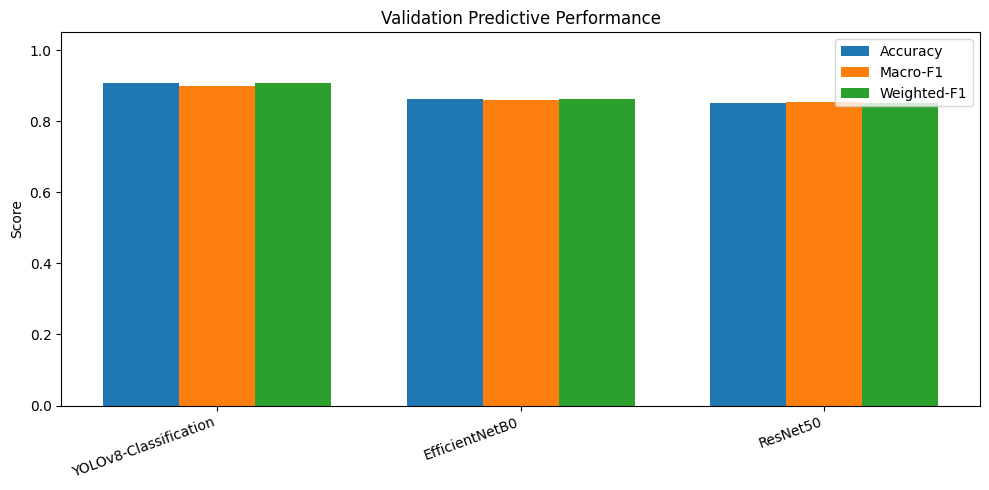

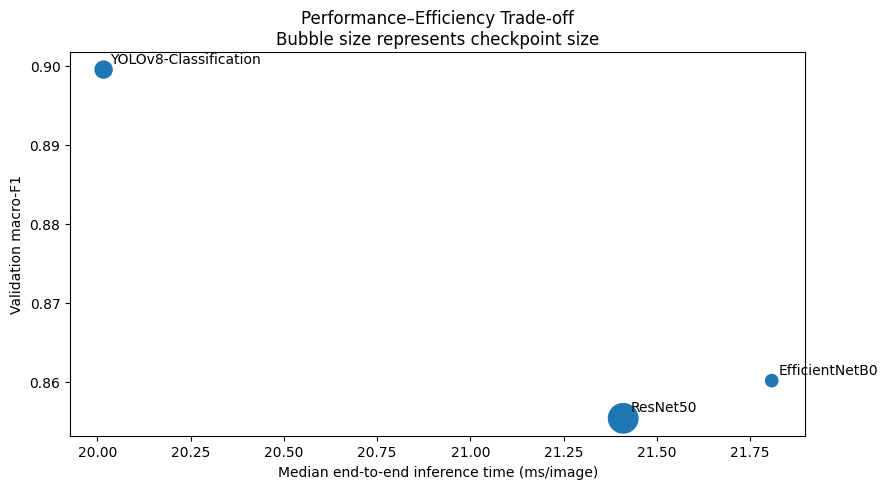

In [32]:
# 11D. Validation comparison visualisations
plt.figure(figsize=(10, 5))
x = np.arange(len(validation_df))
w = 0.25
plt.bar(x - w, validation_df["val_accuracy"], w, label="Accuracy")
plt.bar(x, validation_df["val_macro_f1"], w, label="Macro-F1")
plt.bar(x + w, validation_df["val_weighted_f1"], w, label="Weighted-F1")
plt.xticks(x, validation_df["model"], rotation=20, ha="right")
plt.ylim(0, 1.05)
plt.ylabel("Score")
plt.title("Validation Predictive Performance")
plt.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "validation_model_metrics.png", dpi=180, bbox_inches="tight")
plt.show()

plt.figure(figsize=(9, 5))
plt.scatter(
    validation_df["inference_ms_per_image"],
    validation_df["val_macro_f1"],
    s=np.maximum(validation_df["model_size_mb"] * 5, 30),
)
for _, row in validation_df.iterrows():
    plt.annotate(
        row["model"],
        (row["inference_ms_per_image"], row["val_macro_f1"]),
        xytext=(5, 5), textcoords="offset points"
    )
plt.xlabel("Median end-to-end inference time (ms/image)")
plt.ylabel("Validation macro-F1")
plt.title("Performance–Efficiency Trade-off\nBubble size represents checkpoint size")
plt.tight_layout()
plt.savefig(FIG_DIR / "validation_performance_efficiency.png", dpi=180, bbox_inches="tight")
plt.show()

In [33]:
# 11E. Select model using validation data only
best_val_f1 = validation_df["val_macro_f1"].max()
near_best = validation_df[validation_df["val_macro_f1"] >= best_val_f1 - 0.01].copy()

selected_row = near_best.sort_values(
    ["inference_ms_per_image", "model_size_mb"],
    ascending=[True, True]
).iloc[0]

SELECTED_MODEL = selected_row["model"]

print("Best validation macro-F1:", round(float(best_val_f1), 4))
print("Models within 1 percentage point of best macro-F1:")
display(near_best.round(4))
print("\nSELECTED MODEL:", SELECTED_MODEL)
print(
    "Selection logic: macro-F1 first; if models are within 0.01 macro-F1, "
    "lower end-to-end latency is preferred, then smaller model size."
)

Best validation macro-F1: 0.8995
Models within 1 percentage point of best macro-F1:


,model,val_accuracy,val_balanced_accuracy,val_macro_precision,val_macro_recall,val_macro_f1,val_weighted_f1,model_size_mb,inference_ms_per_image
2,YOLOv8-Classification,0.908,0.8978,0.9059,0.8978,0.8995,0.9072,30.2259,20.0168



SELECTED MODEL: YOLOv8-Classification
Selection logic: macro-F1 first; if models are within 0.01 macro-F1, lower end-to-end latency is preferred, then smaller model size.


## 12. One-time held-out test evaluation

At this point the model-selection decision is fixed. The notebook now evaluates all three fixed checkpoints on the **held-out test set** to support the UREC1 comparison.

Do not tune the models after inspecting these test results. If a new model/hyperparameter experiment is performed, a new untouched test set or a nested validation protocol would be needed for a fully clean final estimate.

In [34]:
# 12A. Final test predictions for all three models
test_rows = []
test_predictions = {}

for model_name, ckpt in [
    ("ResNet50", resnet_ckpt),
    ("EfficientNetB0", eff_ckpt),
]:
    model, saved = load_torch_checkpoint(ckpt)
    y_true, y_pred, probs, paths = predict_torch(model, test_loader)
    metrics = metric_summary(y_true, y_pred)

    test_rows.append({
        "model": model_name,
        **{f"test_{k}": v for k, v in metrics.items()},
    })
    test_predictions[model_name] = (y_true, y_pred, probs, paths)

    del model
    gc.collect()
    if DEVICE.type == "cuda":
        torch.cuda.empty_cache()

# YOLO
y_true, y_pred, probs = yolo_predict_frame(best_yolo_model, test_df)
metrics = metric_summary(y_true, y_pred)
test_rows.append({
    "model": "YOLOv8-Classification",
    **{f"test_{k}": v for k, v in metrics.items()},
})
test_predictions["YOLOv8-Classification"] = (
    y_true, y_pred, probs, test_df["path"].tolist()
)

test_metrics_df = pd.DataFrame(test_rows).sort_values("test_macro_f1", ascending=False)
test_metrics_df.to_csv(ARTIFACT_DIR / "final_test_model_comparison.csv", index=False)
display(test_metrics_df.round(4))

,model,test_accuracy,test_balanced_accuracy,test_macro_precision,test_macro_recall,test_macro_f1,test_weighted_f1
2,YOLOv8-Classification,0.8736,0.8558,0.8801,0.8558,0.8626,0.8707
0,ResNet50,0.8276,0.8102,0.8495,0.8102,0.8159,0.8204
1,EfficientNetB0,0.7701,0.7447,0.7695,0.7447,0.7501,0.7635


In [35]:
# 12B. Combined UREC1 comparison table
final_comparison = validation_df.merge(test_metrics_df, on="model", how="left")
final_comparison["selected_from_validation"] = final_comparison["model"].eq(SELECTED_MODEL)
final_comparison.to_csv(ARTIFACT_DIR / "UREC1_full_model_comparison.csv", index=False)

cols = [
    "model",
    "val_accuracy", "val_macro_f1", "val_weighted_f1",
    "test_accuracy", "test_macro_f1", "test_weighted_f1",
    "model_size_mb", "inference_ms_per_image",
    "selected_from_validation",
]
display(final_comparison[cols].round(4))

,model,val_accuracy,val_macro_f1,val_weighted_f1,test_accuracy,test_macro_f1,test_weighted_f1,model_size_mb,inference_ms_per_image,selected_from_validation
0,YOLOv8-Classification,0.9080,0.8995,0.9072,0.8736,0.8626,0.8707,30.2259,20.0168,True
1,EfficientNetB0,0.8621,0.8602,0.8638,0.7701,0.7501,0.7635,15.6059,21.8078,False
2,ResNet50,0.8506,0.8554,0.8520,0.8276,0.8159,0.8204,90.0284,21.4097,False


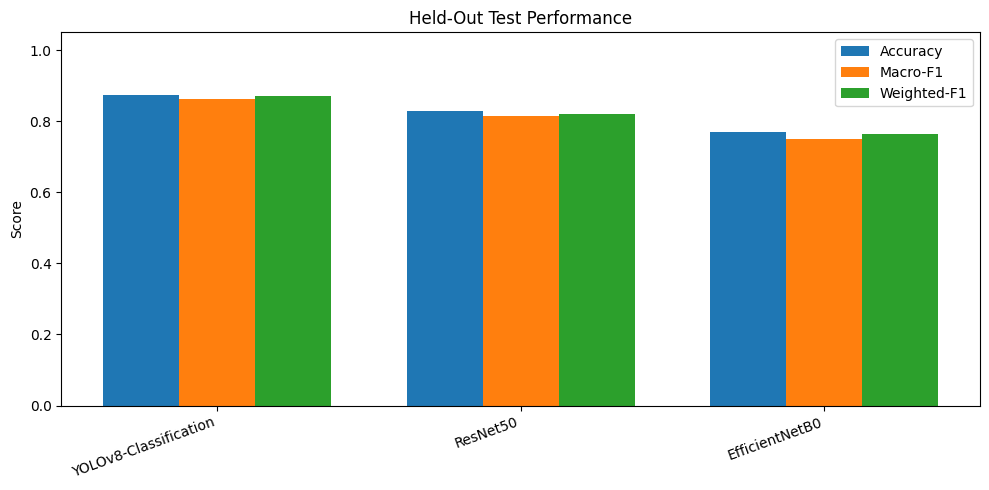

In [36]:
# 12C. Final test performance comparison
ordered = final_comparison.sort_values("test_macro_f1", ascending=False)

plt.figure(figsize=(10, 5))
x = np.arange(len(ordered))
w = 0.25
plt.bar(x - w, ordered["test_accuracy"], w, label="Accuracy")
plt.bar(x, ordered["test_macro_f1"], w, label="Macro-F1")
plt.bar(x + w, ordered["test_weighted_f1"], w, label="Weighted-F1")
plt.xticks(x, ordered["model"], rotation=20, ha="right")
plt.ylim(0, 1.05)
plt.ylabel("Score")
plt.title("Held-Out Test Performance")
plt.legend()
plt.tight_layout()
plt.savefig(FIG_DIR / "test_model_metrics.png", dpi=180, bbox_inches="tight")
plt.show()

## 13. Detailed final-test diagnostics for each model

The next cells generate the dissertation-ready diagnostics required by UREC1 and several additional visualisations:

- full classification report
- count confusion matrix
- normalised confusion matrix
- per-class F1
- one-vs-rest ROC curves
- one-vs-rest precision–recall curves
- confidence histogram
- reliability/calibration curve
- misclassified-image montage

In [37]:
# 13A. Plotting utilities
def safe_filename(name):
    return re.sub(r"[^A-Za-z0-9_-]+", "_", name)

def save_classification_report(model_name, y_true, y_pred):
    report = classification_report(
        y_true,
        y_pred,
        labels=np.arange(len(CLASS_NAMES)),
        target_names=CLASS_NAMES,
        output_dict=True,
        zero_division=0,
    )
    df = pd.DataFrame(report).transpose()
    df.to_csv(ARTIFACT_DIR / f"{safe_filename(model_name)}_classification_report.csv")
    return df

def plot_confusion_matrices(model_name, y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred, labels=np.arange(len(CLASS_NAMES)))

    plt.figure(figsize=(8, 7))
    plt.imshow(cm)
    plt.colorbar()
    plt.xticks(np.arange(len(CLASS_NAMES)), CLASS_NAMES, rotation=40, ha="right")
    plt.yticks(np.arange(len(CLASS_NAMES)), CLASS_NAMES)
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(f"{model_name}: Confusion Matrix (Counts)")
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(j, i, str(cm[i, j]), ha="center", va="center")
    plt.tight_layout()
    plt.savefig(FIG_DIR / f"{safe_filename(model_name)}_confusion_counts.png", dpi=180, bbox_inches="tight")
    plt.show()

    cmn = cm.astype(float) / np.maximum(cm.sum(axis=1, keepdims=True), 1)

    plt.figure(figsize=(8, 7))
    plt.imshow(cmn)
    plt.colorbar()
    plt.xticks(np.arange(len(CLASS_NAMES)), CLASS_NAMES, rotation=40, ha="right")
    plt.yticks(np.arange(len(CLASS_NAMES)), CLASS_NAMES)
    plt.xlabel("Predicted label")
    plt.ylabel("True label")
    plt.title(f"{model_name}: Confusion Matrix (Row Normalised)")
    for i in range(cmn.shape[0]):
        for j in range(cmn.shape[1]):
            plt.text(j, i, f"{cmn[i, j]:.2f}", ha="center", va="center")
    plt.tight_layout()
    plt.savefig(FIG_DIR / f"{safe_filename(model_name)}_confusion_normalised.png", dpi=180, bbox_inches="tight")
    plt.show()

def plot_per_class_f1(model_name, report_df):
    vals = report_df.loc[CLASS_NAMES, "f1-score"].values
    plt.figure(figsize=(10, 5))
    plt.bar(CLASS_NAMES, vals)
    plt.ylim(0, 1.05)
    plt.xticks(rotation=30, ha="right")
    plt.ylabel("F1-score")
    plt.title(f"{model_name}: Per-Class F1")
    plt.tight_layout()
    plt.savefig(FIG_DIR / f"{safe_filename(model_name)}_per_class_f1.png", dpi=180, bbox_inches="tight")
    plt.show()

def plot_roc(model_name, y_true, probs):
    y_bin = label_binarize(y_true, classes=np.arange(len(CLASS_NAMES)))
    plt.figure(figsize=(8, 6))
    for i, label in enumerate(CLASS_NAMES):
        fpr, tpr, _ = roc_curve(y_bin[:, i], probs[:, i])
        score = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"{label} (AUC={score:.3f})")
    plt.plot([0, 1], [0, 1], linestyle="--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"{model_name}: One-vs-Rest ROC Curves")
    plt.legend(fontsize=8)
    plt.tight_layout()
    plt.savefig(FIG_DIR / f"{safe_filename(model_name)}_roc.png", dpi=180, bbox_inches="tight")
    plt.show()

def plot_pr(model_name, y_true, probs):
    y_bin = label_binarize(y_true, classes=np.arange(len(CLASS_NAMES)))
    plt.figure(figsize=(8, 6))
    for i, label in enumerate(CLASS_NAMES):
        precision, recall, _ = precision_recall_curve(y_bin[:, i], probs[:, i])
        # auc() requires increasing x; recall can be descending.
        order = np.argsort(recall)
        score = auc(recall[order], precision[order])
        plt.plot(recall, precision, label=f"{label} (AUC={score:.3f})")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title(f"{model_name}: One-vs-Rest Precision–Recall Curves")
    plt.legend(fontsize=8)
    plt.tight_layout()
    plt.savefig(FIG_DIR / f"{safe_filename(model_name)}_precision_recall.png", dpi=180, bbox_inches="tight")
    plt.show()

def plot_confidence_histogram(model_name, y_true, y_pred, probs):
    confidence = probs.max(axis=1)
    correct = y_true == y_pred

    plt.figure(figsize=(9, 5))
    plt.hist(confidence[correct], bins=12, alpha=0.55, label="Correct")
    plt.hist(confidence[~correct], bins=12, alpha=0.55, label="Incorrect")
    plt.xlabel("Maximum predicted probability")
    plt.ylabel("Images")
    plt.title(f"{model_name}: Prediction Confidence")
    plt.legend()
    plt.tight_layout()
    plt.savefig(FIG_DIR / f"{safe_filename(model_name)}_confidence_histogram.png", dpi=180, bbox_inches="tight")
    plt.show()

def plot_reliability(model_name, y_true, y_pred, probs, n_bins=10):
    confidence = probs.max(axis=1)
    correct = (y_true == y_pred).astype(float)
    edges = np.linspace(0, 1, n_bins + 1)
    bin_ids = np.digitize(confidence, edges[1:-1], right=True)

    mean_conf, mean_acc, counts = [], [], []
    for b in range(n_bins):
        mask = bin_ids == b
        if mask.sum() == 0:
            continue
        mean_conf.append(confidence[mask].mean())
        mean_acc.append(correct[mask].mean())
        counts.append(mask.sum())

    ece = 0.0
    total = len(confidence)
    for c, a, n in zip(mean_conf, mean_acc, counts):
        ece += (n / total) * abs(a - c)

    plt.figure(figsize=(7, 6))
    plt.plot([0, 1], [0, 1], linestyle="--", label="Perfect calibration")
    plt.plot(mean_conf, mean_acc, marker="o", label=f"Observed (ECE={ece:.3f})")
    plt.xlabel("Mean confidence")
    plt.ylabel("Observed accuracy")
    plt.title(f"{model_name}: Reliability Diagram")
    plt.legend()
    plt.tight_layout()
    plt.savefig(FIG_DIR / f"{safe_filename(model_name)}_reliability.png", dpi=180, bbox_inches="tight")
    plt.show()

    return float(ece)

def plot_misclassified(model_name, y_true, y_pred, probs, paths, n=12):
    wrong_idx = np.where(y_true != y_pred)[0]
    if len(wrong_idx) == 0:
        print(f"{model_name}: no misclassifications on this test set.")
        return

    # Highest-confidence mistakes first.
    wrong_idx = sorted(
        wrong_idx,
        key=lambda i: float(probs[i, y_pred[i]]),
        reverse=True
    )[:n]

    cols = 4
    rows = math.ceil(len(wrong_idx) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(13, 3.4 * rows))
    axes = np.array(axes).reshape(-1)

    for ax in axes:
        ax.axis("off")

    for ax, i in zip(axes, wrong_idx):
        with Image.open(paths[i]) as im:
            ax.imshow(im.convert("RGB"))
        ax.axis("off")
        ax.set_title(
            f"True: {CLASS_NAMES[y_true[i]]}\n"
            f"Pred: {CLASS_NAMES[y_pred[i]]}\n"
            f"Conf: {probs[i, y_pred[i]]:.2f}",
            fontsize=9
        )

    plt.suptitle(f"{model_name}: Highest-Confidence Misclassifications", y=1.01)
    plt.tight_layout()
    plt.savefig(FIG_DIR / f"{safe_filename(model_name)}_misclassifications.png", dpi=180, bbox_inches="tight")
    plt.show()


ResNet50
--------


,precision,recall,f1-score,support
Bird-drop,0.7368,0.8750,0.8000,16.0000
Clean,0.7600,1.0000,0.8636,19.0000
Dusty,0.8000,0.6667,0.7273,18.0000
Electrical-damage,1.0000,1.0000,1.0000,9.0000
Physical-Damage,0.8000,0.4444,0.5714,9.0000
Snow-Covered,1.0000,0.8750,0.9333,16.0000
accuracy,0.8276,0.8276,0.8276,0.8276
macro avg,0.8495,0.8102,0.8159,87.0000
weighted avg,0.8371,0.8276,0.8204,87.0000


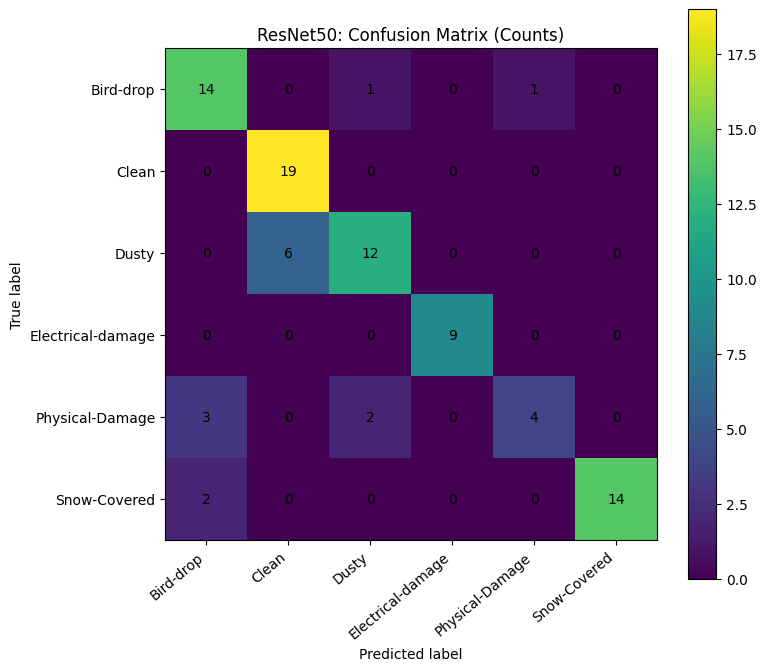

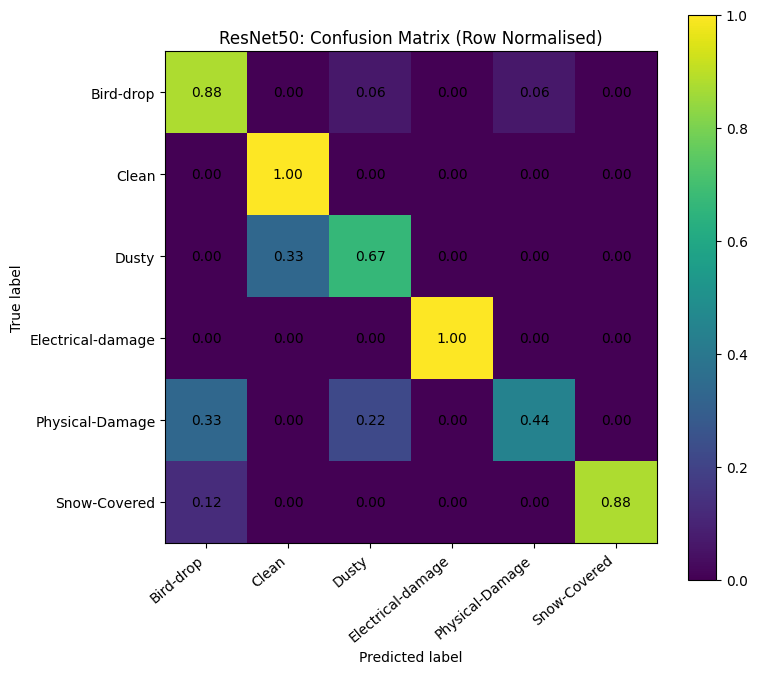

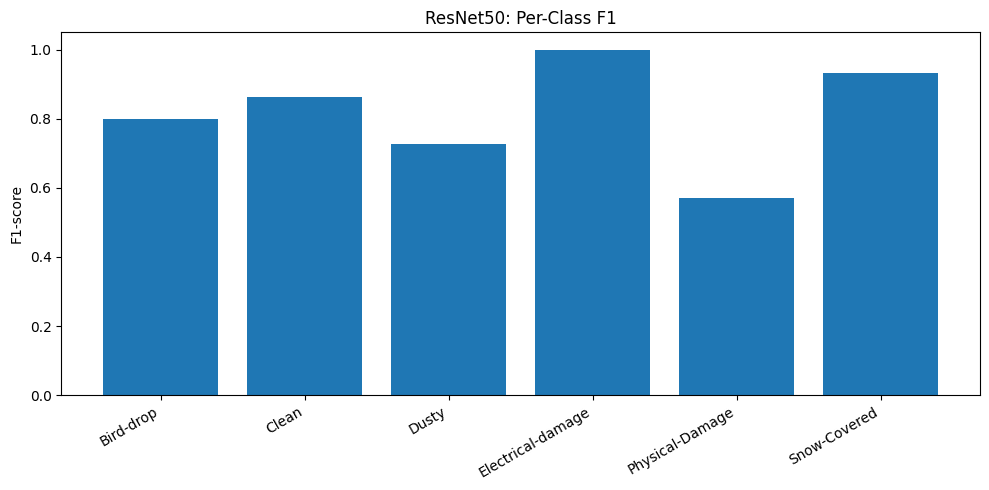

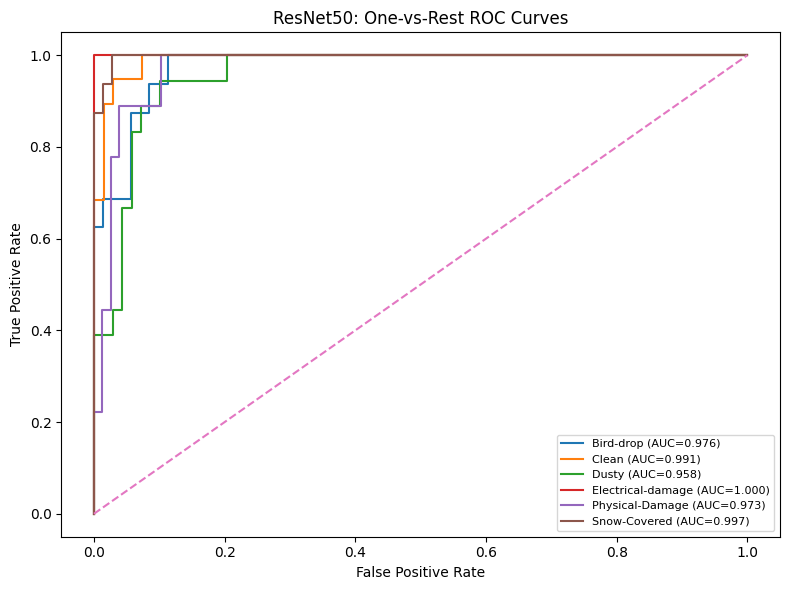

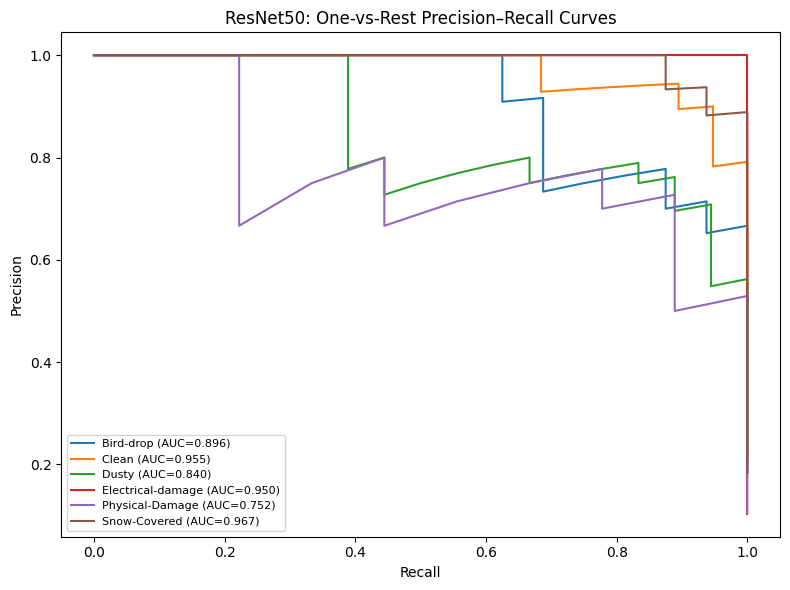

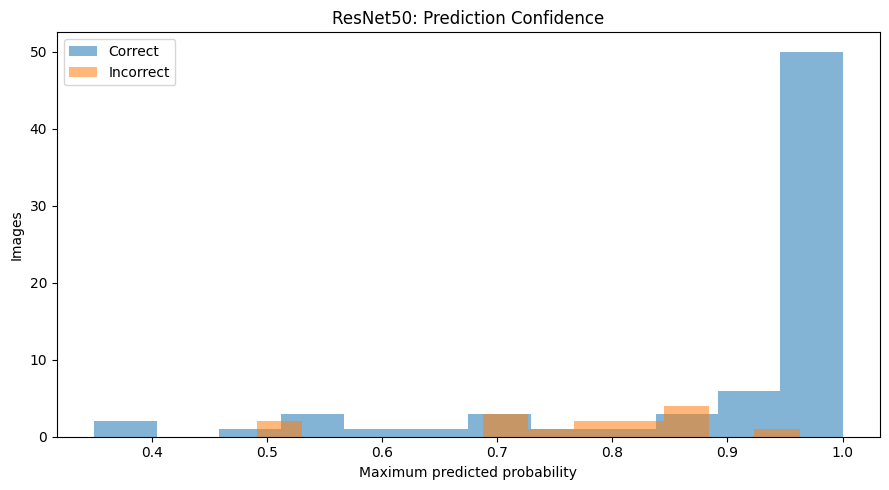

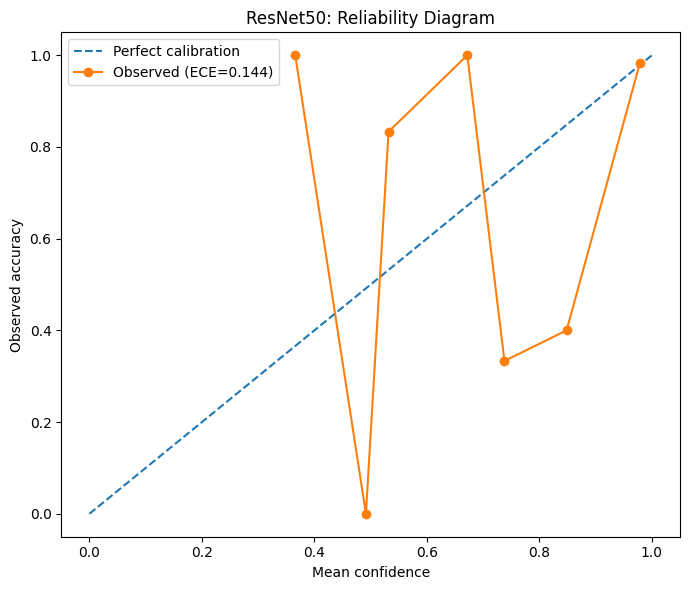

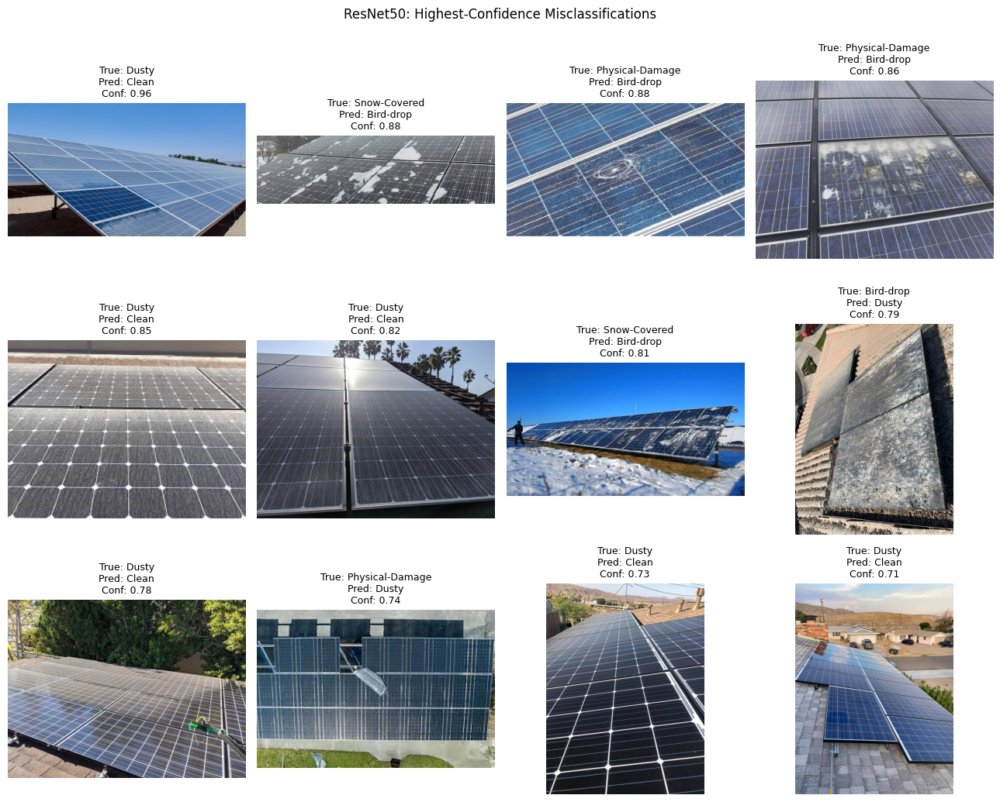


EfficientNetB0
--------------


,precision,recall,f1-score,support
Bird-drop,0.7857,0.6875,0.7333,16.0000
Clean,0.6923,0.9474,0.8000,19.0000
Dusty,0.7333,0.6111,0.6667,18.0000
Electrical-damage,0.7500,0.6667,0.7059,9.0000
Physical-Damage,0.7143,0.5556,0.6250,9.0000
Snow-Covered,0.9412,1.0000,0.9697,16.0000
accuracy,0.7701,0.7701,0.7701,0.7701
macro avg,0.7695,0.7447,0.7501,87.0000
weighted avg,0.7720,0.7701,0.7635,87.0000


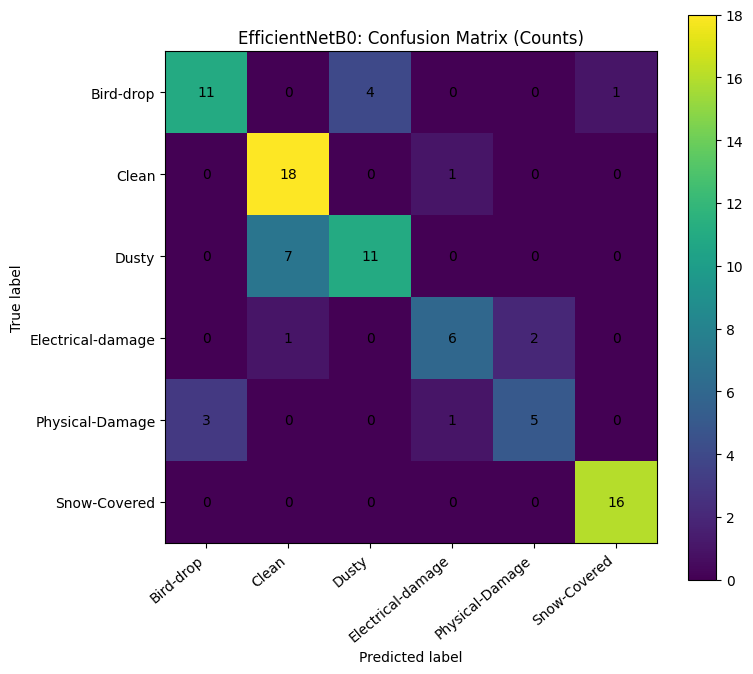

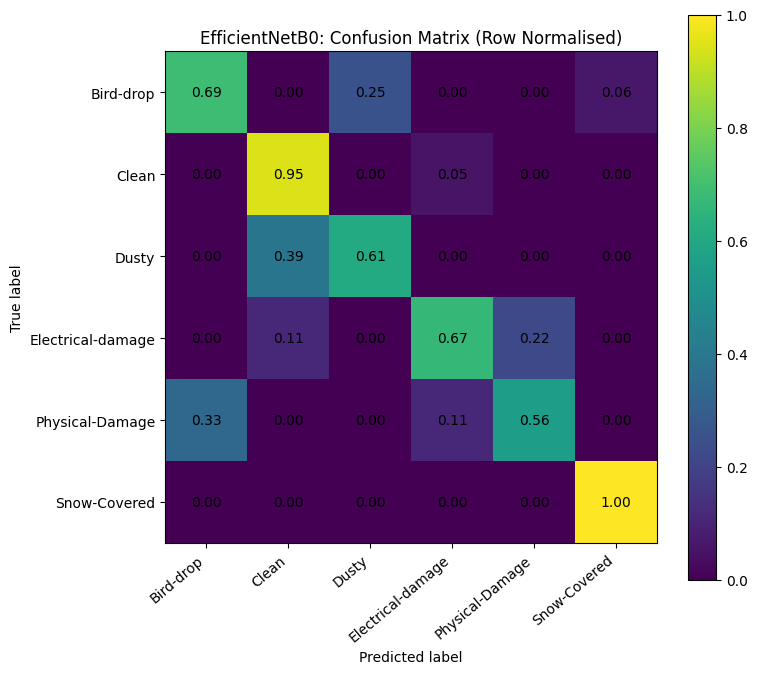

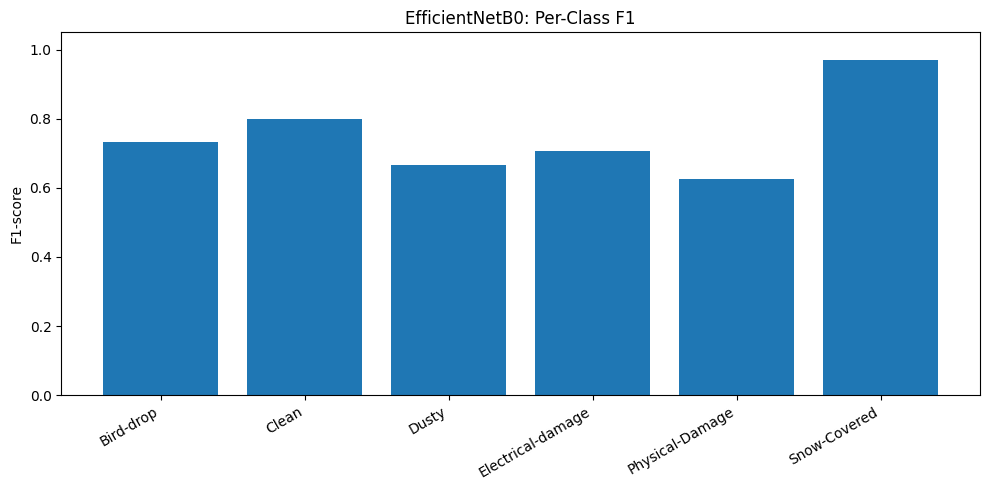

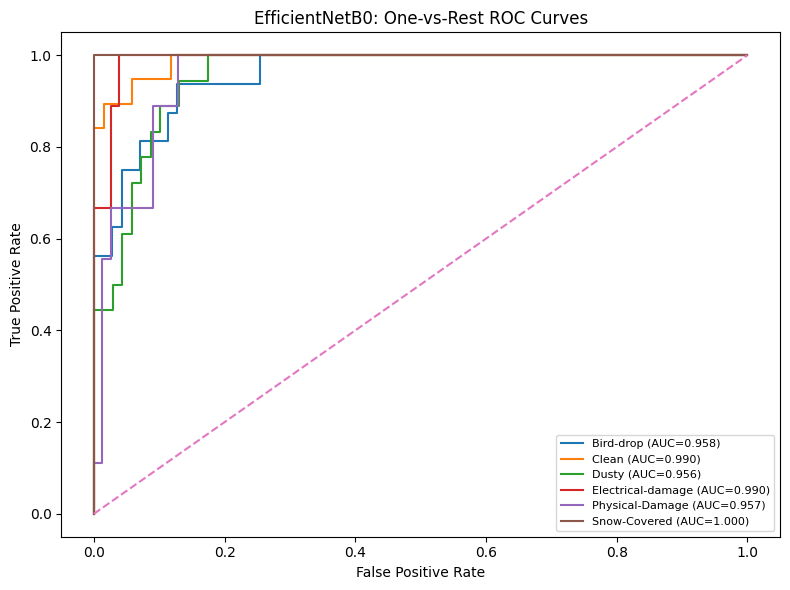

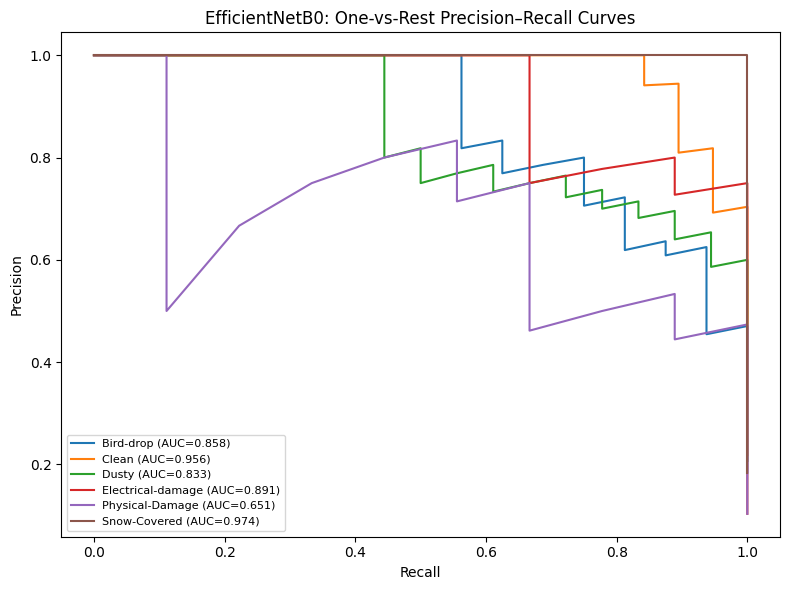

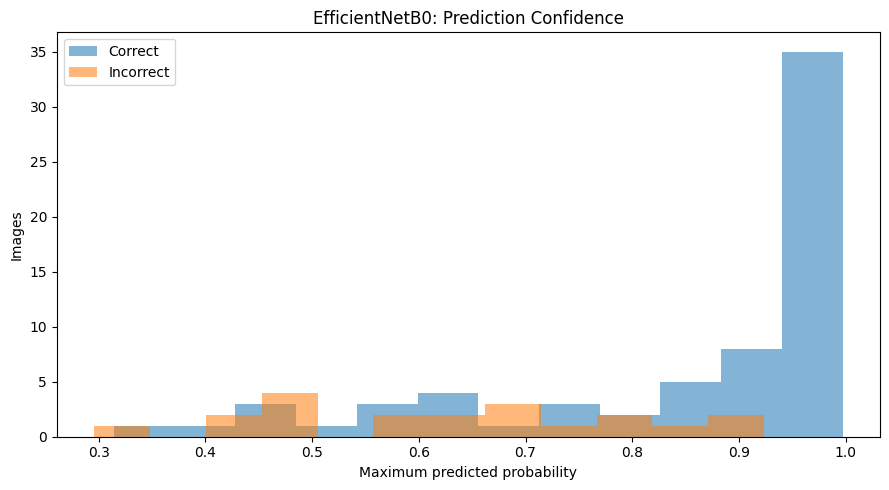

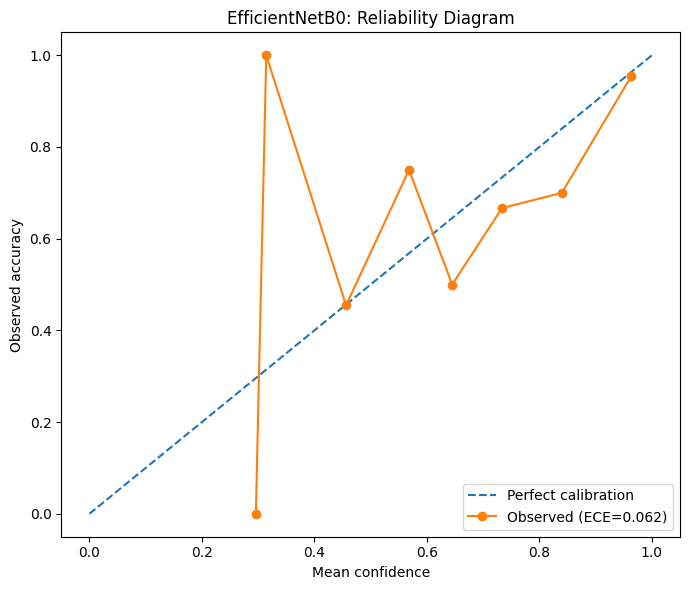

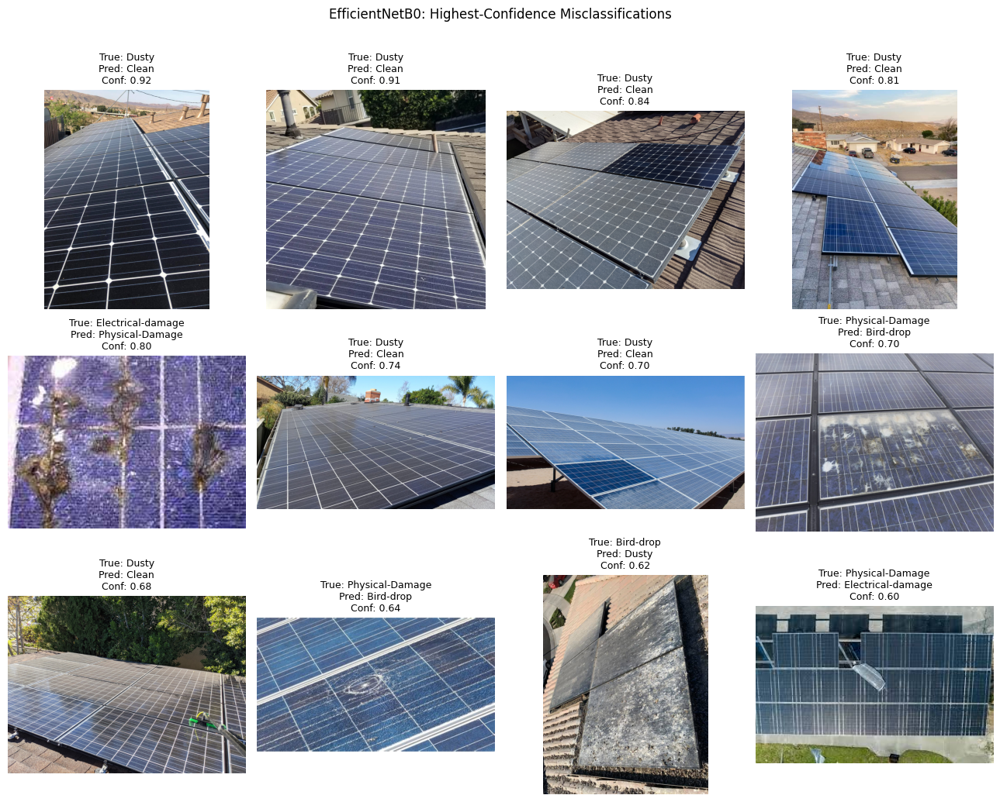


YOLOv8-Classification
---------------------


,precision,recall,f1-score,support
Bird-drop,0.9167,0.6875,0.7857,16.0000
Clean,0.9000,0.9474,0.9231,19.0000
Dusty,0.7727,0.9444,0.8500,18.0000
Electrical-damage,1.0000,0.8889,0.9412,9.0000
Physical-Damage,0.7500,0.6667,0.7059,9.0000
Snow-Covered,0.9412,1.0000,0.9697,16.0000
accuracy,0.8736,0.8736,0.8736,0.8736
macro avg,0.8801,0.8558,0.8626,87.0000
weighted avg,0.8791,0.8736,0.8707,87.0000


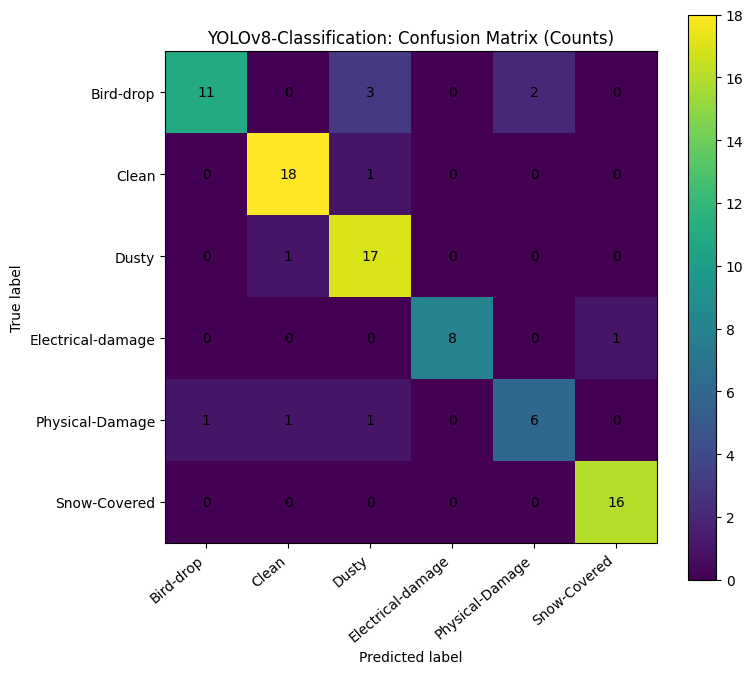

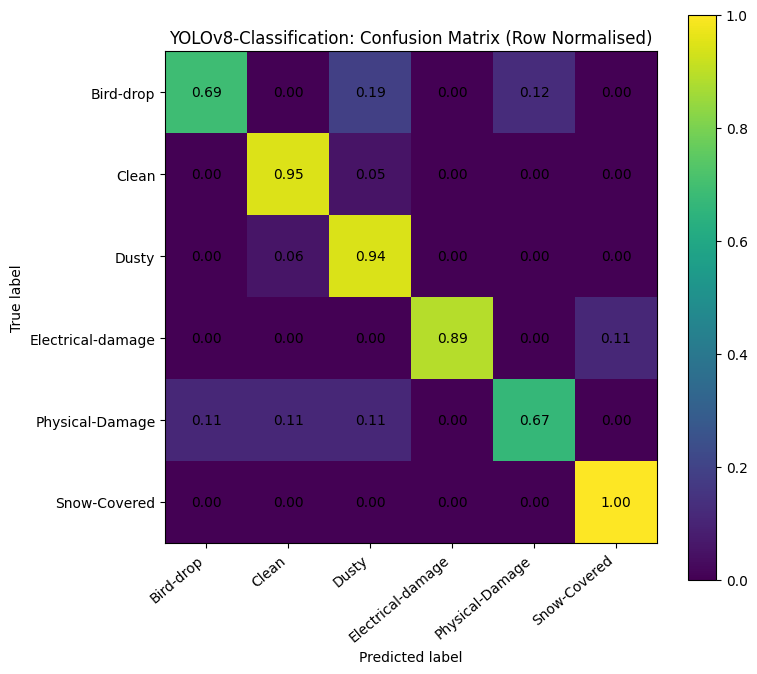

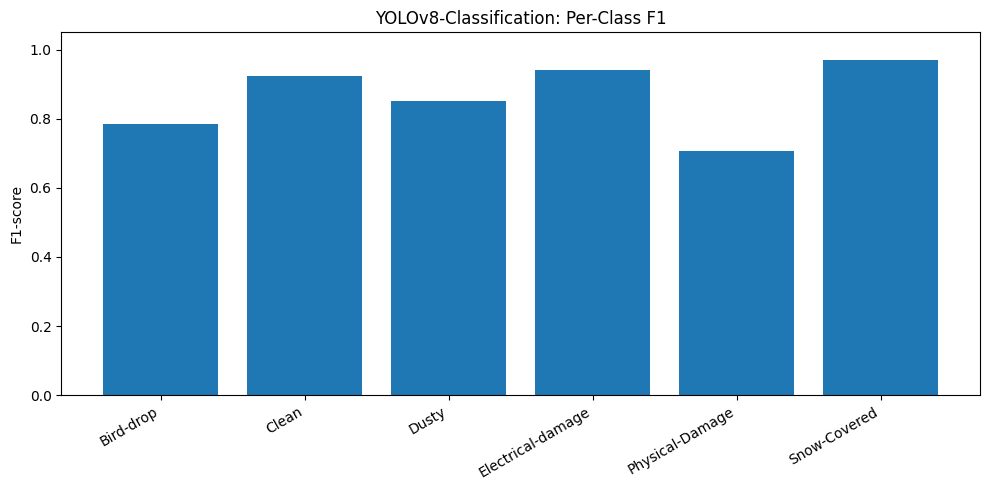

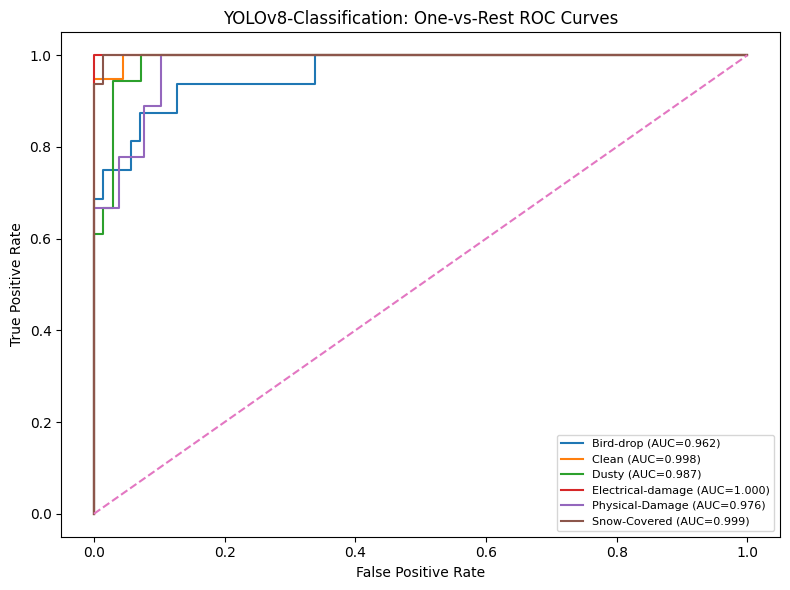

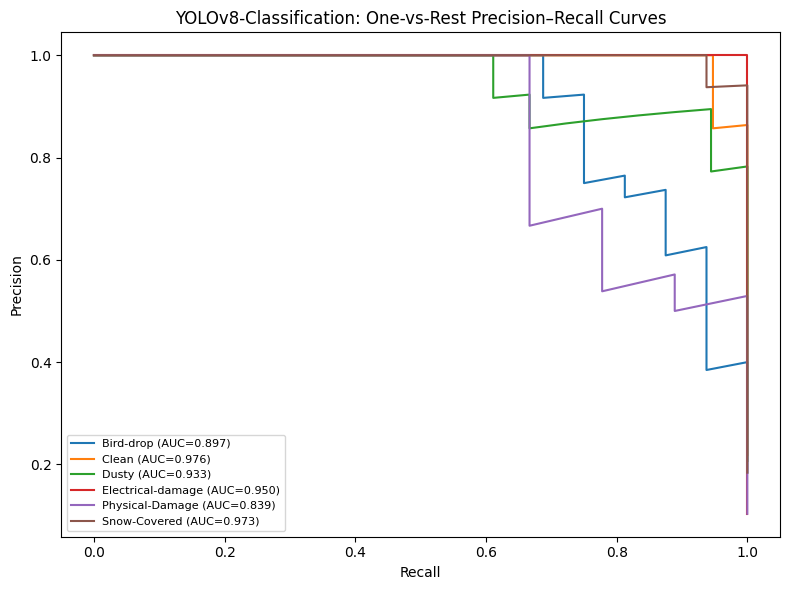

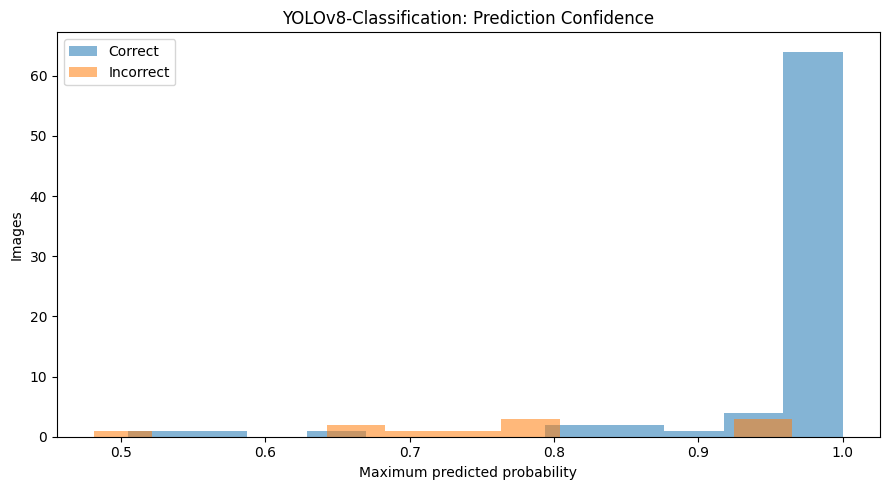

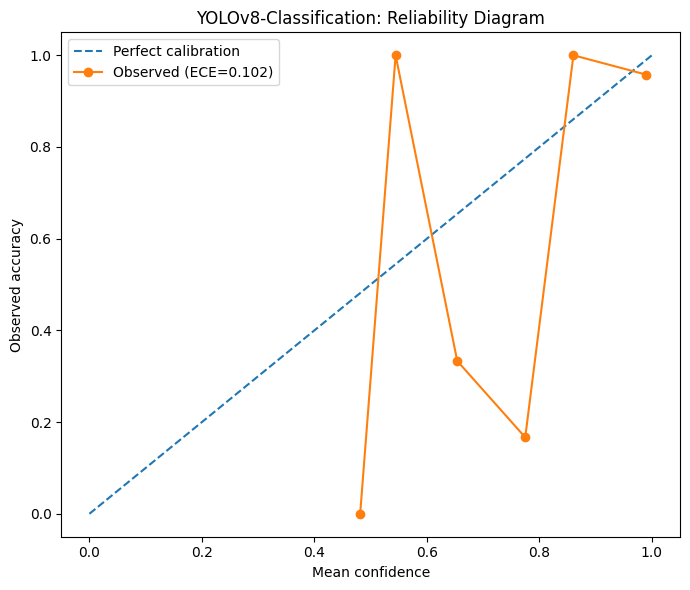

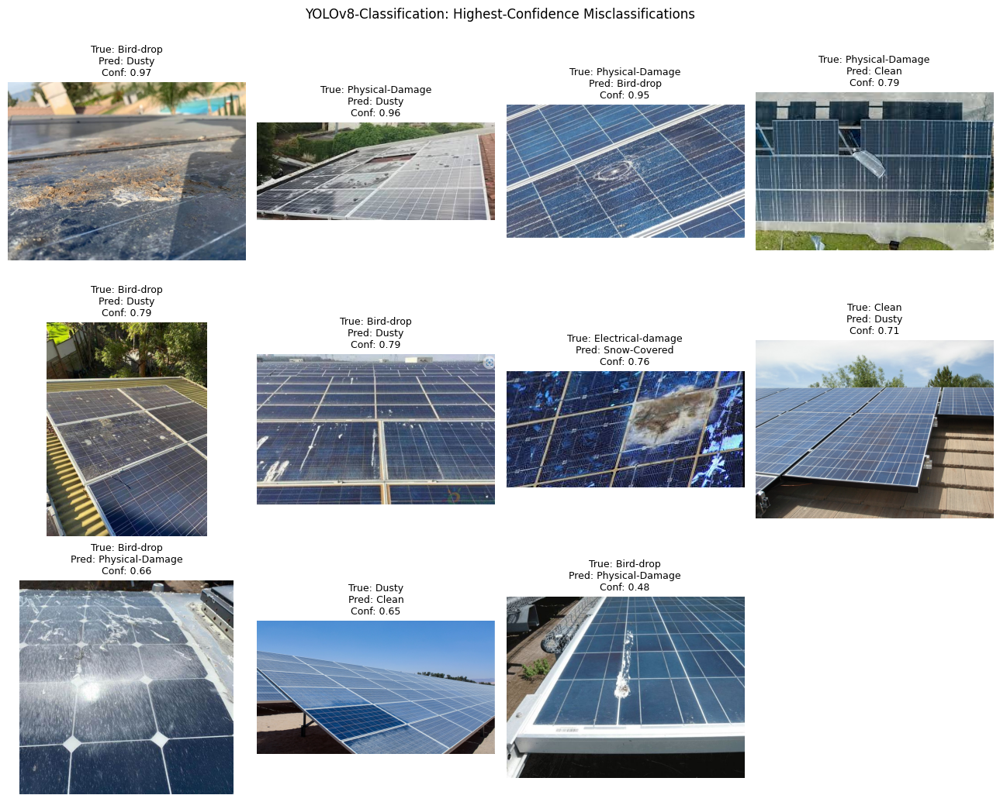

,model,ECE
0,ResNet50,0.1445
1,EfficientNetB0,0.0617
2,YOLOv8-Classification,0.1016


In [38]:
# 13B. Generate all detailed diagnostics
calibration_rows = []

for model_name in ["ResNet50", "EfficientNetB0", "YOLOv8-Classification"]:
    print("\n" + model_name)
    print("-" * len(model_name))

    y_true, y_pred, probs, paths = test_predictions[model_name]

    report_df = save_classification_report(model_name, y_true, y_pred)
    display(report_df.round(4))

    plot_confusion_matrices(model_name, y_true, y_pred)
    plot_per_class_f1(model_name, report_df)
    plot_roc(model_name, y_true, probs)
    plot_pr(model_name, y_true, probs)
    plot_confidence_histogram(model_name, y_true, y_pred, probs)
    ece = plot_reliability(model_name, y_true, y_pred, probs)
    plot_misclassified(model_name, y_true, y_pred, probs, paths, n=12)

    calibration_rows.append({"model": model_name, "ECE": ece})

calibration_df = pd.DataFrame(calibration_rows)
calibration_df.to_csv(ARTIFACT_DIR / "calibration_summary.csv", index=False)
display(calibration_df.round(4))

## 14. Inspect the selected model's predictions

This cell creates a row-level test-results CSV for the selected model. It is useful for error analysis, appendices and reproducibility.

In [39]:
# 14. Selected-model prediction table
sel_true, sel_pred, sel_probs, sel_paths = test_predictions[SELECTED_MODEL]

pred_table = pd.DataFrame({
    "path": sel_paths,
    "actual": [CLASS_NAMES[i] for i in sel_true],
    "predicted": [CLASS_NAMES[i] for i in sel_pred],
    "confidence": sel_probs.max(axis=1),
    "correct": sel_true == sel_pred,
})

for i, cls in enumerate(CLASS_NAMES):
    pred_table[f"prob_{cls}"] = sel_probs[:, i]

pred_table.to_csv(ARTIFACT_DIR / "selected_model_test_predictions.csv", index=False)
display(pred_table.head(20))
print("Saved:", ARTIFACT_DIR / "selected_model_test_predictions.csv")

,path,actual,predicted,confidence,correct,prob_Bird-drop,prob_Clean,prob_Dusty,prob_Electrical-damage,prob_Physical-Damage,prob_Snow-Covered
0,/kaggle/input/datasets/alicjalena/pv-panel-def...,Physical-Damage,Physical-Damage,0.998966,True,3.751125e-04,4.350047e-05,9.938359e-06,1.643077e-04,9.989659e-01,4.413014e-04
1,/kaggle/input/datasets/alicjalena/pv-panel-def...,Dusty,Dusty,0.999947,True,3.704728e-06,2.972555e-06,9.999473e-01,3.361385e-08,4.560891e-05,2.927233e-07
2,/kaggle/input/datasets/alicjalena/pv-panel-def...,Snow-Covered,Snow-Covered,0.978338,True,2.520476e-03,1.324701e-03,1.733505e-02,7.262646e-05,4.095804e-04,9.783376e-01
3,/kaggle/input/datasets/alicjalena/pv-panel-def...,Bird-drop,Bird-drop,0.999981,True,9.999813e-01,1.611239e-08,4.141673e-06,5.878207e-08,1.417096e-05,3.008647e-07
4,/kaggle/input/datasets/alicjalena/pv-panel-def...,Clean,Clean,0.999633,True,1.490351e-04,9.996332e-01,1.969544e-05,1.835646e-04,8.508337e-06,6.047106e-06
5,/kaggle/input/datasets/alicjalena/pv-panel-def...,Bird-drop,Bird-drop,0.996316,True,9.963159e-01,9.630096e-06,8.637988e-04,3.296105e-05,5.993239e-04,2.178449e-03
6,/kaggle/input/datasets/alicjalena/pv-panel-def...,Dusty,Dusty,0.999378,True,2.838406e-04,2.987115e-04,9.993777e-01,2.840950e-05,8.205081e-06,3.293779e-06
7,/kaggle/input/datasets/alicjalena/pv-panel-def...,Snow-Covered,Snow-Covered,0.999263,True,4.226280e-04,9.295999e-05,1.645167e-04,2.072605e-06,5.481314e-05,9.992631e-01
8,/kaggle/input/datasets/alicjalena/pv-panel-def...,Bird-drop,Bird-drop,0.995207,True,9.952069e-01,2.810608e-05,1.560892e-03,1.120364e-04,2.880222e-03,2.119056e-04
9,/kaggle/input/datasets/alicjalena/pv-panel-def...,Dusty,Dusty,0.999999,True,2.577106e-07,3.641140e-07,9.999992e-01,2.051087e-07,2.741726e-08,4.864625e-09


Saved: /kaggle/working/pv_urec1_final/artifacts/selected_model_test_predictions.csv


## 15. Package the selected model for Hugging Face Spaces

The UREC1 prototype is specified as **Streamlit**. Hugging Face Spaces can run Streamlit using a **Docker Space**, so this notebook packages:

- `app.py`
- selected model weights
- `model_meta.json`
- `requirements.txt`
- `Dockerfile`
- `README.md`

The app returns:
- predicted solar-panel condition
- confidence score
- probability table for all six classes

It also includes an academic-prototype disclaimer.

After this cell runs, download:

`/kaggle/working/pv_urec1/hf_space_bundle.zip`

Then create a new Hugging Face Space with **Docker** SDK and upload the unzipped files.

In [40]:
# 15A. Copy selected checkpoint + write deployment metadata
if HF_DIR.exists():
    shutil.rmtree(HF_DIR)
HF_DIR.mkdir(parents=True, exist_ok=True)

if SELECTED_MODEL == "ResNet50":
    shutil.copy2(resnet_ckpt, HF_DIR / "model.pt")
    model_type = "torchvision"
    arch = "ResNet50"
elif SELECTED_MODEL == "EfficientNetB0":
    shutil.copy2(eff_ckpt, HF_DIR / "model.pt")
    model_type = "torchvision"
    arch = "EfficientNetB0"
elif SELECTED_MODEL == "YOLOv8-Classification":
    shutil.copy2(yolo_best, HF_DIR / "model.pt")
    model_type = "ultralytics"
    arch = "YOLOv8-Classification"
else:
    raise ValueError(SELECTED_MODEL)

meta = {
    "selected_model": SELECTED_MODEL,
    "model_type": model_type,
    "arch": arch,
    "class_names": CLASS_NAMES,
    "img_size": IMG_SIZE,
    "dataset_name": EXPECTED_DATASET_NAME,
    "dataset_creator": EXPECTED_DATASET_CREATOR,
    "dataset_url": EXPECTED_DATASET_URL,
    "dataset_licence": EXPECTED_LICENCE,
    "raw_image_count_observed": len(source_manifest_df),
    "unique_valid_image_count": len(clean_df),
    "training_image_count": len(train_df),
    "validation_image_count": len(val_df),
    "test_image_count": len(test_df),
    "research_scope": "Academic, non-commercial RGB image-classification prototype",
}

with open(HF_DIR / "model_meta.json", "w") as f:
    json.dump(meta, f, indent=2)

print(json.dumps(meta, indent=2))

{
  "selected_model": "YOLOv8-Classification",
  "model_type": "ultralytics",
  "arch": "YOLOv8-Classification",
  "class_names": [
    "Bird-drop",
    "Clean",
    "Dusty",
    "Electrical-damage",
    "Physical-Damage",
    "Snow-Covered"
  ],
  "img_size": 224,
  "dataset_name": "PV Panel Defect Dataset",
  "dataset_creator": "Alicja Lenarczyk",
  "dataset_url": "https://www.kaggle.com/datasets/alicjalena/pv-panel-defect-dataset",
  "dataset_licence": "CC BY-NC-SA 4.0",
  "raw_image_count_observed": 1574,
  "unique_valid_image_count": 869,
  "training_image_count": 695,
  "validation_image_count": 87,
  "test_image_count": 87,
  "research_scope": "Academic, non-commercial RGB image-classification prototype"
}


In [41]:
# 15B. Create Streamlit app.py
app_code = r"""
import json
from pathlib import Path

import numpy as np
import pandas as pd
from PIL import Image
import streamlit as st
import torch
import torch.nn as nn
from torchvision import models, transforms

ROOT = Path(__file__).resolve().parent

with open(ROOT / "model_meta.json", "r") as f:
    META = json.load(f)

CLASS_NAMES = META["class_names"]
IMG_SIZE = int(META["img_size"])
MODEL_TYPE = META["model_type"]
ARCH = META["arch"]

st.set_page_config(
    page_title="Solar Panel Condition Classifier",
    page_icon="☀️",
    layout="centered",
)

st.title("☀️ Solar Panel Condition Classifier")
st.write(
    "Upload a visible-light RGB image of a photovoltaic panel. "
    "The model predicts one of six panel conditions and reports a confidence score."
)

@st.cache_resource
def load_model():
    if MODEL_TYPE == "ultralytics":
        from ultralytics import YOLO
        return YOLO(str(ROOT / "model.pt"))

    checkpoint = torch.load(ROOT / "model.pt", map_location="cpu")

    if ARCH == "ResNet50":
        model = models.resnet50(weights=None)
        in_features = model.fc.in_features
        model.fc = nn.Sequential(
            nn.Dropout(0.30),
            nn.Linear(in_features, len(CLASS_NAMES)),
        )

    elif ARCH == "EfficientNetB0":
        model = models.efficientnet_b0(weights=None)
        in_features = model.classifier[1].in_features
        model.classifier = nn.Sequential(
            nn.Dropout(0.30),
            nn.Linear(in_features, len(CLASS_NAMES)),
        )
    else:
        raise ValueError(f"Unsupported architecture: {ARCH}")

    model.load_state_dict(checkpoint["state_dict"])
    model.eval()
    return model

MODEL = load_model()

EVAL_TRANSFORM = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        [0.485, 0.456, 0.406],
        [0.229, 0.224, 0.225],
    ),
])

def predict(image):
    image = image.convert("RGB")

    if MODEL_TYPE == "ultralytics":
        result = MODEL.predict(source=image, imgsz=IMG_SIZE, verbose=False)[0]
        raw = result.probs.data.detach().cpu().numpy()
        aligned = np.zeros(len(CLASS_NAMES), dtype=np.float32)

        for raw_idx, class_name in result.names.items():
            aligned[CLASS_NAMES.index(class_name)] = raw[int(raw_idx)]

        probs = aligned

    else:
        x = EVAL_TRANSFORM(image).unsqueeze(0)
        with torch.no_grad():
            logits = MODEL(x)
            probs = torch.softmax(logits, dim=1)[0].numpy()

    pred_idx = int(np.argmax(probs))
    return CLASS_NAMES[pred_idx], float(probs[pred_idx]), probs

uploaded = st.file_uploader(
    "Upload a solar-panel image",
    type=["jpg", "jpeg", "png", "webp"],
)

if uploaded is not None:
    image = Image.open(uploaded).convert("RGB")
    st.image(image, caption="Uploaded image", use_container_width=True)

    label, confidence, probs = predict(image)

    st.subheader(f"Prediction: {label}")
    st.metric("Confidence", f"{confidence * 100:.2f}%")

    prob_df = pd.DataFrame({
        "Condition": CLASS_NAMES,
        "Probability": probs,
    }).sort_values("Probability", ascending=False)

    st.dataframe(
        prob_df.assign(Probability=lambda d: (d["Probability"] * 100).round(2)),
        use_container_width=True,
        hide_index=True,
    )

    st.bar_chart(prob_df.set_index("Condition"))

st.divider()
st.caption(
    "Academic prototype only. It classifies visible RGB images and is not a certified "
    "electrical-safety, maintenance or industrial inspection system. Predictions should "
    "not replace qualified inspection."
)
st.caption(
    f"Model: {META['selected_model']} | "
    f"Training dataset: {META['dataset_name']} by {META['dataset_creator']} | "
    f"Dataset licence recorded for the research: {META['dataset_licence']}"
)
"""

(HF_DIR / "app.py").write_text(app_code, encoding="utf-8")
print("Created:", HF_DIR / "app.py")

Created: /kaggle/working/pv_urec1_final/hf_space/app.py


In [42]:
# 15C. Create requirements.txt, Dockerfile, and README.md
requirements = """\
streamlit>=1.37,<2
torch>=2.2
torchvision>=0.17
ultralytics>=8.3,<9
Pillow>=10
numpy>=1.26
pandas>=2
"""

dockerfile = """\
FROM python:3.11-slim

ENV PYTHONUNBUFFERED=1 \
    PIP_NO_CACHE_DIR=1

RUN apt-get update && apt-get install -y --no-install-recommends \
    libgl1 \
    libglib2.0-0 \
    && rm -rf /var/lib/apt/lists/*

WORKDIR /app
COPY requirements.txt /app/requirements.txt
RUN pip install -r /app/requirements.txt

COPY . /app

EXPOSE 7860

CMD ["streamlit", "run", "app.py", \
     "--server.address=0.0.0.0", \
     "--server.port=7860", \
     "--server.headless=true", \
     "--browser.gatherUsageStats=false"]
"""

readme = f"""\
---
title: Solar Panel Condition Classifier
emoji: ☀️
colorFrom: yellow
colorTo: green
sdk: docker
app_port: 7860
pinned: false
---

# Solar Panel Condition Classifier

Academic Streamlit prototype for six-class visible-light RGB solar-panel condition classification.

## Model
Selected in the Kaggle research pipeline: **{SELECTED_MODEL}**

## Classes
{chr(10).join("- " + c for c in CLASS_NAMES)}

## Dataset attribution
- Dataset: {EXPECTED_DATASET_NAME}
- Creator: {EXPECTED_DATASET_CREATOR}
- Source: {EXPECTED_DATASET_URL}
- Licence recorded in the research ethics form: {EXPECTED_LICENCE}

This Space does not redistribute the training images.

## Scope
This is a non-commercial academic prototype. It is not a certified electrical-safety or industrial inspection system and should not replace qualified inspection.
"""

(HF_DIR / "requirements.txt").write_text(requirements, encoding="utf-8")
(HF_DIR / "Dockerfile").write_text(dockerfile, encoding="utf-8")
(HF_DIR / "README.md").write_text(readme, encoding="utf-8")

print("Deployment files:")
for f in sorted(HF_DIR.iterdir()):
    print(" -", f.name)

Deployment files:
 - Dockerfile
 - README.md
 - app.py
 - model.pt
 - model_meta.json
 - requirements.txt


In [43]:
# 15D. Zip the Hugging Face Space
bundle_base = WORK / "hf_space_bundle"
zip_path = Path(shutil.make_archive(str(bundle_base), "zip", root_dir=HF_DIR))
print("Created:", zip_path)
print("Upload the unzipped contents to a Hugging Face Space configured with SDK = Docker.")

Created: /kaggle/working/pv_urec1_final/hf_space_bundle.zip
Upload the unzipped contents to a Hugging Face Space configured with SDK = Docker.


## 16. Research-output inventory and archive

The final archive contains tables, figures, trained checkpoints, training logs and the Hugging Face deployment bundle. The temporary YOLO dataset folder is deliberately excluded so the ZIP does not duplicate the Kaggle training images.

In [44]:
# 16. Create a complete research-output archive without copied raw images

print("Artifact tables")
for path in sorted(ARTIFACT_DIR.glob("*")):
    print("-", path)

print("\nFigures")
for path in sorted(FIG_DIR.glob("*.png")):
    print("-", path)

print("\nCheckpoints")
for path in sorted(CKPT_DIR.glob("*")):
    print("-", path)
print("-", yolo_best)

print("\nHugging Face deployment bundle")
print("-", WORK / "hf_space_bundle.zip")

archive_path = Path("/kaggle/working/PV_Panel_Defect_Final_Research_Outputs.zip")

if archive_path.exists():
    archive_path.unlink()

# Add research artefacts while excluding the copied YOLO train/val/test image directory.
with zipfile.ZipFile(archive_path, "w", compression=zipfile.ZIP_DEFLATED) as archive:
    included_roots = [ARTIFACT_DIR, FIG_DIR, CKPT_DIR, YOLO_RUN_DIR, HF_DIR]

    for root_directory in included_roots:
        if not root_directory.exists():
            continue

        for file_path in root_directory.rglob("*"):
            if file_path.is_file():
                relative_name = file_path.relative_to(WORK.parent)
                archive.write(file_path, arcname=str(relative_name))

    hf_bundle_path = WORK / "hf_space_bundle.zip"
    if hf_bundle_path.exists():
        archive.write(
            hf_bundle_path,
            arcname=str(hf_bundle_path.relative_to(WORK.parent))
        )

print("\nFinal selected model:", SELECTED_MODEL)
print("Research archive:", archive_path)
print("Archive size: {:.2f} MB".format(archive_path.stat().st_size / (1024 ** 2)))
print(
    "Methodology reminder: the held-out test results are final. "
    "Do not retune model hyperparameters after reviewing them."
)

Artifact tables
- /kaggle/working/pv_urec1_final/artifacts/EfficientNetB0_classification_report.csv
- /kaggle/working/pv_urec1_final/artifacts/EfficientNetB0_training_history.csv
- /kaggle/working/pv_urec1_final/artifacts/ResNet50_classification_report.csv
- /kaggle/working/pv_urec1_final/artifacts/ResNet50_training_history.csv
- /kaggle/working/pv_urec1_final/artifacts/UREC1_full_model_comparison.csv
- /kaggle/working/pv_urec1_final/artifacts/YOLOv8-Classification_classification_report.csv
- /kaggle/working/pv_urec1_final/artifacts/calibration_summary.csv
- /kaggle/working/pv_urec1_final/artifacts/clean_image_manifest.csv
- /kaggle/working/pv_urec1_final/artifacts/cross_class_duplicate_conflicts.csv
- /kaggle/working/pv_urec1_final/artifacts/final_test_model_comparison.csv
- /kaggle/working/pv_urec1_final/artifacts/raw_image_audit.csv
- /kaggle/working/pv_urec1_final/artifacts/selected_model_test_predictions.csv
- /kaggle/working/pv_urec1_final/artifacts/source_manifest_before_quality

## 17. Dissertation reporting checklist

When writing the methodology and results chapters, report only **observed values from the final executed notebook**.

Include:

1. Dataset citation: Alicja Lenarczyk, *PV Panel Defect Dataset*.
2. CC BY-NC-SA 4.0 licence recorded in UREC1.
3. Confirmation that the raw attached image count matched the UREC1 dataset.
4. Number of unreadable images, if any.
5. Cross-class exact duplicate conflicts excluded.
6. Same-class exact duplicates removed.
7. Final unique-image count.
8. Stratified 80:10:10 split counts and hash-based leakage check.
9. Training-only augmentation.
10. Imbalance ratio and whether weighted loss/weighted sampling was activated.
11. ResNet-50 transfer-learning and fine-tuning configuration.
12. EfficientNet-B0 transfer-learning and fine-tuning configuration.
13. YOLOv8 Classification configuration.
14. Validation-only model-selection rule.
15. Held-out test accuracy and balanced accuracy.
16. Per-class precision, recall and F1-score.
17. Macro-F1 and weighted-F1.
18. Confusion matrices.
19. ROC-AUC and PR-AUC curves.
20. Confidence distributions, reliability diagrams and ECE.
21. Model size and end-to-end inference time.
22. Highest-confidence errors and limitations.
23. Streamlit/Hugging Face deployment artefacts.
24. Clear statement that the prototype performs **image-level classification**, not bounding-box defect localisation.
25. Clear statement that the application is an academic prototype and not a certified electrical-safety or industrial inspection system.

### Final submission rule

Run the notebook from top to bottom in Kaggle with the approved dataset attached, save the executed notebook version with all outputs, and do not tune the models after reviewing the held-out test results.